## Analysis v4

In [1]:
import os
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
from natsort import index_natsorted

### Calculating the Variance of the AF and FPS values 

It would be quite interesting to see if for each variant site per motif, the variance of the AF and FPS values are correlated.

I.e. if a variant site has a high variance in AF values, does it also have a high variance in FPS values?

First, load the data file as dataframe and then truncate the columns to include on AF and FPS data. Next, convert the dataframe into long format.

In [2]:
# import the data
filepath = '/home/users/ntu/suffiazi/scratch/outputs/tmp/input_data/E2F5_E2F5_HUMAN.H11MO.0.B_fpscore-af-varsites-combined-matrix-wide.tsv'
# filename = '/scratch/users/ntu/suffiazi/outputs/tmp/plotting-parallel/input_data/ARNT_ARNT_HUMAN.H11MO.0.B_fpscore-af-varsites-combined-matrix-wide.tsv'
matrix_afps = pd.read_csv(filepath, sep='\t')
# extract motif id from filename
motif_id = os.path.basename(filepath).replace('_fpscore-af-varsites-combined-matrix-wide.tsv', '')
motif_id

'E2F5_E2F5_HUMAN.H11MO.0.B'

In [3]:
matrix_afps.head()

,Chromosome,Start,End,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,...,ANAB5F7_basal_AF,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,PU24GB8_lumB_AF,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,S6R691V_her2_AF,region_id
0,chr1,905473,905483,0.10260,0.12218,0.13921,0.12024,0.14062,NaN,NaN,...,0.000000,905474.0,G,A,0.027778,NaN,NaN,NaN,0.000000,chr1:905473-905483
1,chr1,925405,925415,0.09540,0.03670,0.09011,0.05082,0.05586,925409.0,T,...,0.730769,925409.0,T,C,0.769231,925409.0,T,C,0.730769,chr1:925405-925415
2,chr1,1020750,1020760,0.09749,0.09080,0.07864,0.10880,0.08458,1020755.0,C,...,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,chr1:1020750-1020760
3,chr1,1130413,1130423,0.11471,0.04786,0.11338,0.14384,0.15151,1130420.0,C,...,0.062500,1130420.0,C,T,0.131579,1130420.0,C,T,0.147059,chr1:1130413-1130423
4,chr1,1225277,1225287,0.01792,0.04624,0.02729,0.01957,0.02657,1225285.0,G,...,0.062500,1225285.0,G,A,0.078947,1225285.0,G,A,0.088235,chr1:1225277-1225287


Let's filter the loaded table to include only the `_AF` and `_fps` columns, as well as the `region_id` column.

In [4]:
afps_df = matrix_afps.filter(regex='_AF$|_fps$|_id$').copy()
afps_df.head(5)

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
0,0.10260,0.12218,0.13921,0.12024,0.14062,0.000000,0.000000,0.000000,0.027778,0.000000,chr1:905473-905483
1,0.09540,0.03670,0.09011,0.05082,0.05586,1.000000,1.000000,0.730769,0.769231,0.730769,chr1:925405-925415
2,0.09749,0.09080,0.07864,0.10880,0.08458,0.062500,0.000000,0.000000,0.000000,0.000000,chr1:1020750-1020760
3,0.11471,0.04786,0.11338,0.14384,0.15151,0.250000,0.181818,0.062500,0.131579,0.147059,chr1:1130413-1130423
4,0.01792,0.04624,0.02729,0.01957,0.02657,0.071429,0.090909,0.062500,0.078947,0.088235,chr1:1225277-1225287


In [5]:
# convert to long format
afps_df_long = afps_df.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
afps_df_long[['sample_id', 'type']] = afps_df_long['variable'].str.rsplit('_', n=1, expand=True)

# drop the redundant 'variable' column
afps_df_long = afps_df_long.drop(columns=["variable"])

# now pivot the dataframe to create new columns based on the type column
afps_df_lpv = afps_df_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
afps_df_lpv = afps_df_lpv.rename_axis(None, axis=1).rename(columns={'fps': 'FPS'})

# sort the dataframe by region_id naturally
afps_df_lpv = afps_df_lpv.reindex(index=index_natsorted(afps_df_lpv['region_id']))
afps_df_lpv = afps_df_lpv.reset_index(drop=True)
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062
1,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260
2,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218
3,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024
4,chr1:905473-905483,S6R691V_her2,0.000000,0.13921
...,...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522
10921,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392
10922,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363
10923,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735


In [6]:
# afps_df_lpv[afps_df_lpv['sample_id'] == '2GAMBDQ_norm'].describe()

### AF–FPS Matrix
At this point, we now have both a matrix of AF and FPS values in wide form (`afps_df`) and the same dataset in long form (`afps_df_lpv`). We can scale the FPS values to be between 0 and 1 now.

In [7]:
# use MinMaxScaler to scale the raw fps values to range between 0 and 1
from sklearn.preprocessing import MinMaxScaler
# scale the FPS values to a range of 0-1
# Initialize a MinMaxScaler
scaler = MinMaxScaler()

# copy df
fps_df_scaled = matrix_afps.filter(regex='_fps$|_id$').copy()

# set the index to 'region_id'
fps_df_scaled = fps_df_scaled.set_index('region_id')

# Fit the MinMaxScaler to the 'FPS' column and transform it
fps_df_scaled = pd.DataFrame(scaler.fit_transform(fps_df_scaled), columns=fps_df_scaled.columns, index=fps_df_scaled.index)

# rename columns by adding '_scaled' to the column names
fps_df_scaled = fps_df_scaled.add_suffix('_scaled')
fps_df_scaled

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:905473-905483,0.045183,0.062660,0.069304,0.056307,0.065892
chr1:925405-925415,0.042012,0.018821,0.044860,0.023798,0.026175
chr1:1020750-1020760,0.042933,0.046566,0.039150,0.050950,0.039632
chr1:1130413-1130423,0.050516,0.024545,0.056445,0.067359,0.070994
chr1:1225277-1225287,0.007892,0.023714,0.013586,0.009164,0.012450
...,...,...,...,...,...
chrX:118300271-118300281,0.003096,0.005052,0.002768,0.002861,0.004264
chrX:119211181-119211191,0.005351,0.006087,0.005103,0.006397,0.006813
chrX:139342109-139342119,0.008878,0.004262,0.010728,0.007750,0.010121


Now we should convert the FPS scaled dataframe into long form.

In [8]:
# reset index
fps_df_scaled_long = fps_df_scaled.reset_index()
# convert to long format
fps_df_scaled_long = fps_df_scaled_long.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
# Split the 'variable' column into three parts
fps_df_scaled_long[['part1', 'part2', 'part3']] = fps_df_scaled_long['variable'].str.rsplit('_', n=2, expand=True)

# Assign part1 to 'sample_id' and concatenate the other parts to form 'type'
fps_df_scaled_long['sample_id'] = fps_df_scaled_long['part1']
fps_df_scaled_long['type'] = fps_df_scaled_long['part2'].str.upper() + '_' + fps_df_scaled_long['part3']

# Drop the unnecessary columns
fps_df_scaled_long = fps_df_scaled_long.drop(['variable', 'part1', 'part2', 'part3'], axis=1)

# now pivot the dataframe to create new columns based on the type column
fps_df_scaled_lpv = fps_df_scaled_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
fps_df_scaled_lpv = fps_df_scaled_lpv.rename_axis(None, axis=1)

# sort the dataframe by region_id naturally
fps_df_scaled_lpv = fps_df_scaled_lpv.reindex(index=index_natsorted(fps_df_scaled_lpv['region_id']))
fps_df_scaled_lpv = fps_df_scaled_lpv.reset_index(drop=True)
fps_df_scaled_lpv

,region_id,sample_id,FPS_scaled
0,chr1:905473-905483,2GAMBDQ_norm,0.065892
1,chr1:905473-905483,98JKPD8_lumA,0.045183
2,chr1:905473-905483,ANAB5F7_basal,0.062660
3,chr1:905473-905483,PU24GB8_lumB,0.056307
4,chr1:905473-905483,S6R691V_her2,0.069304
...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.096162
10921,chrX:150849074-150849084,98JKPD8_lumA,0.151456
10922,chrX:150849074-150849084,ANAB5F7_basal,0.037761
10923,chrX:150849074-150849084,PU24GB8_lumB,0.115831


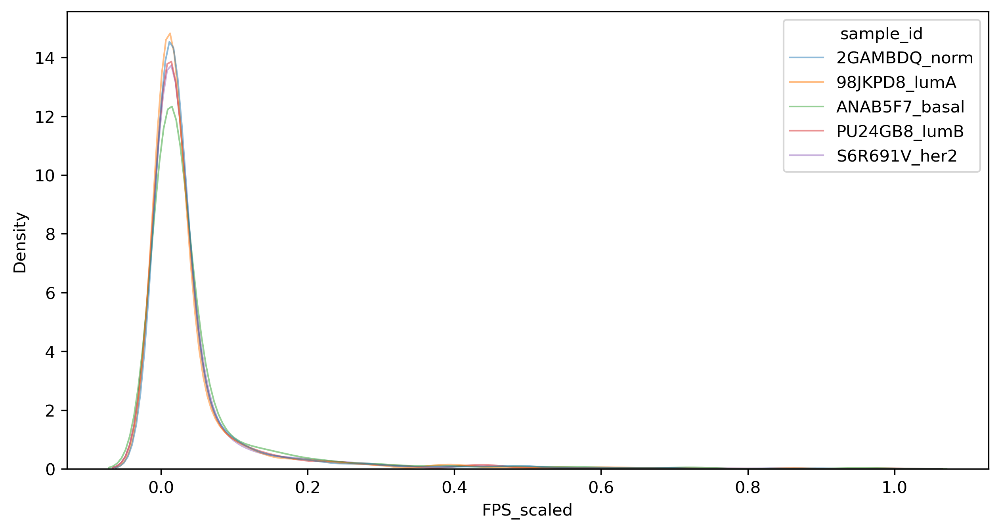

In [9]:
# plot fps distribution
plt.figure(figsize=(10, 5), dpi=300)
sns.kdeplot(data=fps_df_scaled_lpv, x="FPS_scaled", hue="sample_id", fill=False, common_norm=False, alpha=.5, linewidth=1)
plt.show()

### Merging `afps_df_lpv` and `fps_df_scaled_lpv`

Now we can merge the two long dataframes together to get both raw FPS and scaled FPS values in one dataframe.

In [10]:
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062
1,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260
2,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218
3,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024
4,chr1:905473-905483,S6R691V_her2,0.000000,0.13921
...,...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522
10921,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392
10922,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363
10923,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735


In [11]:
fps_df_scaled_lpv

,region_id,sample_id,FPS_scaled
0,chr1:905473-905483,2GAMBDQ_norm,0.065892
1,chr1:905473-905483,98JKPD8_lumA,0.045183
2,chr1:905473-905483,ANAB5F7_basal,0.062660
3,chr1:905473-905483,PU24GB8_lumB,0.056307
4,chr1:905473-905483,S6R691V_her2,0.069304
...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.096162
10921,chrX:150849074-150849084,98JKPD8_lumA,0.151456
10922,chrX:150849074-150849084,ANAB5F7_basal,0.037761
10923,chrX:150849074-150849084,PU24GB8_lumB,0.115831


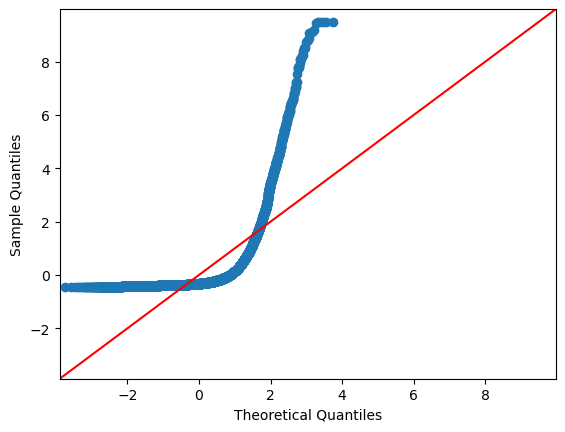

In [12]:
fig = sm.qqplot(fps_df_scaled_lpv['FPS_scaled'], line='45', fit=True)
plt.show()

In [13]:
# merge two dataframes on region_id and sample_id
afps_full_dfl = afps_df_lpv.merge(fps_df_scaled_lpv, on=['region_id', 'sample_id'])
afps_full_dfl

,region_id,sample_id,AF,FPS,FPS_scaled
0,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892
1,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183
2,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660
3,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307
4,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304
...,...,...,...,...,...
10920,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162
10921,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456
10922,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761
10923,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831


In [14]:
# save to file
# afps_full_dfl.to_csv(f'/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/AF-FPS_regionsorted_full_longtable/{motif_id}_afps_full_scaled_longtable.tsv', sep='\t', index=False)

### Calculating Variation Statistics
With the full data table cleaned up into a long format, we can now calculate the variation statistics for each region. We will calculate the following statistics:
* variance (Var)
* ~~coefficient of variation (CV)~~
* ~~quartile coefficient of dispersion (QCD)~~

First calculate statistics on the raw FPS data.

In [15]:
# extract fps columns
fps_df = matrix_afps.filter(regex='_fps$|_id$').copy()
# calculate variance of fps values across samples per region_id and add to a new column called 'fps_var'
fps_df = fps_df.set_index('region_id')
fps_df['FPS_var'] = fps_df.var(axis=1)
# calculate the coefficient of variation (CV) of fps values across samples per region_id and add to a new column called 'fps_cv'
# fps_df['FPS_cv'] = fps_df.drop(columns=['FPS_var']).std(axis=1) / fps_df.drop(columns=['FPS_var']).mean(axis=1) * 100
# calculate the quartile coefficient of dispersion (QCD) of fps values across samples per region_id and add to a new column called 'fps_qcd'
# fps_df['FPS_qcd'] = (fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.75, axis=1) - fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.25, axis=1)) / (fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.75, axis=1) + fps_df.drop(columns=['FPS_var', 'FPS_cv']).quantile(q=0.25, axis=1))
fps_df.head()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,FPS_var
region_id,,,,,,
chr1:905473-905483,0.10260,0.12218,0.13921,0.12024,0.14062,0.000245
chr1:925405-925415,0.09540,0.03670,0.09011,0.05082,0.05586,0.000659
chr1:1020750-1020760,0.09749,0.09080,0.07864,0.10880,0.08458,0.000137
chr1:1130413-1130423,0.11471,0.04786,0.11338,0.14384,0.15151,0.001668
chr1:1225277-1225287,0.01792,0.04624,0.02729,0.01957,0.02657,0.000127


Then do the same on the fps scaled data.

In [16]:
# copy fps_df_scaled
fps_df_scaled_cp = fps_df_scaled.copy()
# calculate variance of fps_scaled values across samples per region_id and add to a new column called 'fps_scaled_var'
fps_df_scaled_cp['FPS_scaled_var'] = fps_df_scaled_cp.var(axis=1)
# calculate the coefficient of variation (CV) of fps values across samples per region_id and add to a new column called 'fps_scaled_cv'
# fps_df_scaled['FPS_scaled_cv'] = fps_df_scaled.drop(columns=['FPS_scaled_var']).std(axis=1) / fps_df_scaled.drop(columns=['FPS_scaled_var']).mean(axis=1) * 100
# calculate the quartile coefficient of dispersion (QCD) of fps values across samples per region_id and add to a new column called 'fps_scaled_qcd'
# fps_df_scaled['FPS_scaled_qcd'] = (fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.75, axis=1) - fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.25, axis=1)) / (fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.75, axis=1) + fps_df_scaled.drop(columns=['FPS_scaled_var', 'FPS_scaled_cv']).quantile(q=0.25, axis=1))
fps_df_scaled_cp.head()

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled,FPS_scaled_var
region_id,,,,,,
chr1:905473-905483,0.045183,0.062660,0.069304,0.056307,0.065892,0.000090
chr1:925405-925415,0.042012,0.018821,0.044860,0.023798,0.026175,0.000134
chr1:1020750-1020760,0.042933,0.046566,0.039150,0.050950,0.039632,0.000025
chr1:1130413-1130423,0.050516,0.024545,0.056445,0.067359,0.070994,0.000338
chr1:1225277-1225287,0.007892,0.023714,0.013586,0.009164,0.012450,0.000039


In [17]:
# Do the same for AF values
# extract af columns
af_df = matrix_afps.filter(regex='_AF$|_id$')
af_df = af_df.set_index('region_id')
# then calculate variance of af values across samples per region_id and add to a new column called 'af_var'
af_df['AF_var'] = af_df.var(axis=1)
af_df.head()

,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,AF_var
region_id,,,,,,
chr1:905473-905483,0.000000,0.000000,0.000000,0.027778,0.000000,0.000154
chr1:925405-925415,1.000000,1.000000,0.730769,0.769231,0.730769,0.019970
chr1:1020750-1020760,0.062500,0.000000,0.000000,0.000000,0.000000,0.000781
chr1:1130413-1130423,0.250000,0.181818,0.062500,0.131579,0.147059,0.004728
chr1:1225277-1225287,0.071429,0.090909,0.062500,0.078947,0.088235,0.000139


Now merge the statistics tables together on `region_id` index.

In [18]:
# subset only the fps stats columns
# fps_stats_df = fps_df.filter(regex='_var$|_cv$|_qcd$|_id$').copy()
# fps_scaled_stats_df = fps_df_scaled.filter(regex='_var$|_cv$|_qcd$|_id$').copy()
fps_stats_df = fps_df.filter(regex='_var$|_id$').copy()
fps_scaled_stats_df = fps_df_scaled_cp.filter(regex='_var$|_id$').copy()
af_stats_df = af_df.filter(regex='_var$|_id$').copy()
# merge on region_id index from both tables
fps_stats_df_temp = fps_stats_df.merge(fps_scaled_stats_df, left_index=True, right_index=True)
# now merge with af_df
afps_stats_df = fps_stats_df_temp.merge(af_stats_df, left_index=True, right_index=True)
afps_stats_df


,FPS_var,FPS_scaled_var,AF_var
region_id,,,
chr1:905473-905483,0.000245,9.036129e-05,0.000154
chr1:925405-925415,0.000659,1.341879e-04,0.019970
chr1:1020750-1020760,0.000137,2.462661e-05,0.000781
chr1:1130413-1130423,0.001668,3.382467e-04,0.004728
chr1:1225277-1225287,0.000127,3.889771e-05,0.000139
...,...,...,...
chrX:118300271-118300281,0.000003,1.009942e-06,0.001020
chrX:119211181-119211191,0.000003,5.101216e-07,0.001672
chrX:139342109-139342119,0.000031,6.536719e-06,0.000889


Now we have a table of stats data to merge with the longform AF_FPS table (`afps_full_dfl`).

In [19]:
# set the index to 'region_id'
afps_full_dfli = afps_full_dfl.set_index('region_id')
afps_full_dfli

,sample_id,AF,FPS,FPS_scaled
region_id,,,,
chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892
chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183
chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660
chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307
chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304
...,...,...,...,...
chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162
chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456
chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761


In [20]:
# merge afps_full_dfli with stats df on region_id
afps_merged_stats = afps_full_dfli.merge(afps_stats_df, left_index=True, right_index=True, how='left')
# sort naturally by region_id
afps_stats_mergesorted =afps_merged_stats.reset_index().reindex(index=index_natsorted(afps_merged_stats.index))
afps_stats_mergesorted

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090,0.000154
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090,0.000154
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090,0.000154
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090,0.000154
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090,0.000154
...,...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.008072
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.008072
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.008072
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.008072


In [21]:
# save file 
# afps_stats_mergesorted.to_csv(f'/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/AF-FPS_regionsorted_full_longtable/{motif_id}_afps_full_scaled_longtable_with_stats.tsv', sep='\t', index=False)

#### ASIDE: Visualizing `FPS_scaled_var` and `AF_var`
We can now see if there is a correlation between the variance of the AF and FPS values, per `region_id`. As the statistics are calculated per `region_id`, we can plot the `FPS_scaled_var` and `AF_var` values against each other.

In [22]:
# subset a copy of the dataframe with only the AF_var and FPS_scaled_var columns and region_id
afps_stats_ms_var = afps_stats_mergesorted[['region_id', 'FPS_scaled_var', 'AF_var']].copy().drop_duplicates().reset_index(drop=True)
# set region_id as index and then plot lmplot
afps_stats_ms_var = afps_stats_ms_var.set_index('region_id')
afps_stats_ms_var

,FPS_scaled_var,AF_var
region_id,,
chr1:905473-905483,9.036129e-05,0.000154
chr1:925405-925415,1.341879e-04,0.019970
chr1:1020750-1020760,2.462661e-05,0.000781
chr1:1130413-1130423,3.382467e-04,0.004728
chr1:1225277-1225287,3.889771e-05,0.000139
...,...,...
chrX:118300271-118300281,1.009942e-06,0.001020
chrX:119211181-119211191,5.101216e-07,0.001672
chrX:139342109-139342119,6.536719e-06,0.000889


In [23]:
# show rows with FPS_scaled_var > 0.001 and AF_var > 0.001
test_df = afps_stats_ms_var[(afps_stats_ms_var['FPS_scaled_var'] > 0.001) & (afps_stats_ms_var['AF_var'] > 0.001)]

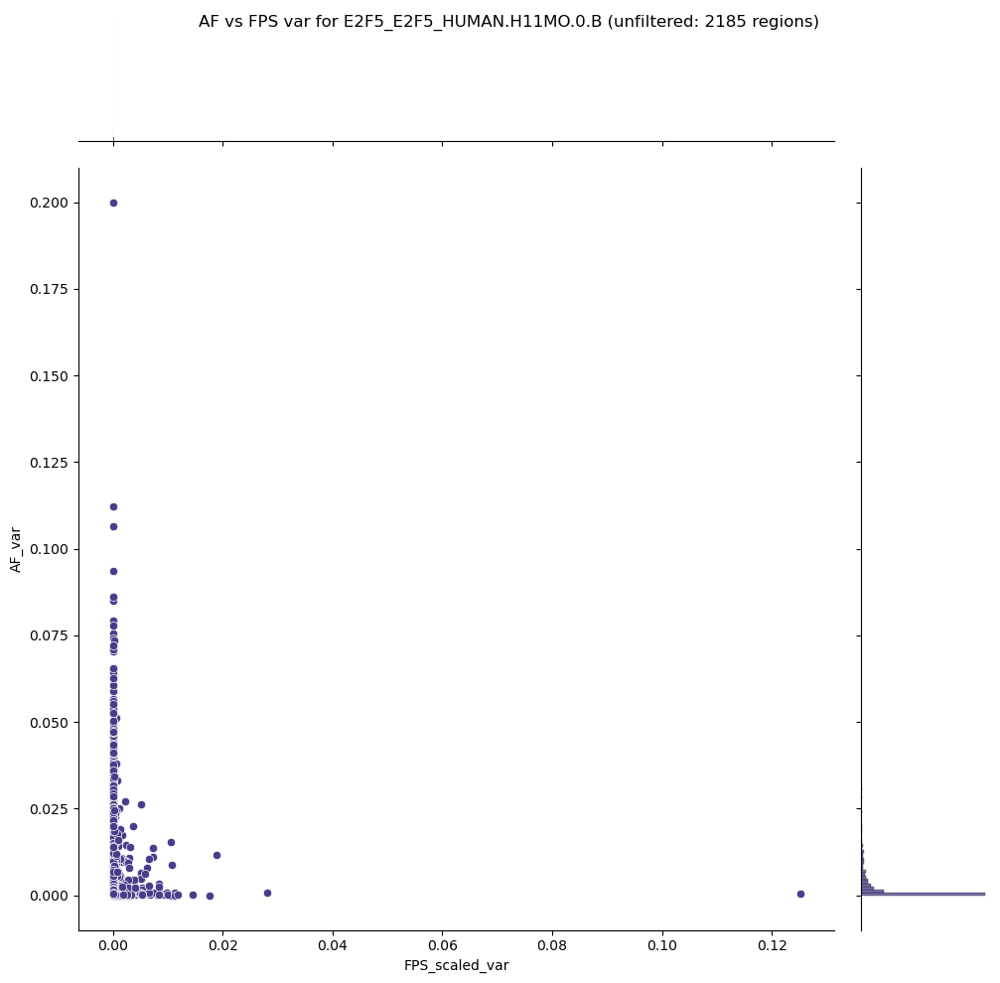

In [24]:
# plot the jointplot
g = sns.jointplot(data=afps_stats_ms_var, x="FPS_scaled_var", y="AF_var", height=10, ratio=5, color='darkslateblue' )
g.fig.suptitle(f'AF vs FPS var for {motif_id} (unfiltered: {len(afps_stats_ms_var)} regions)')
plt.show()

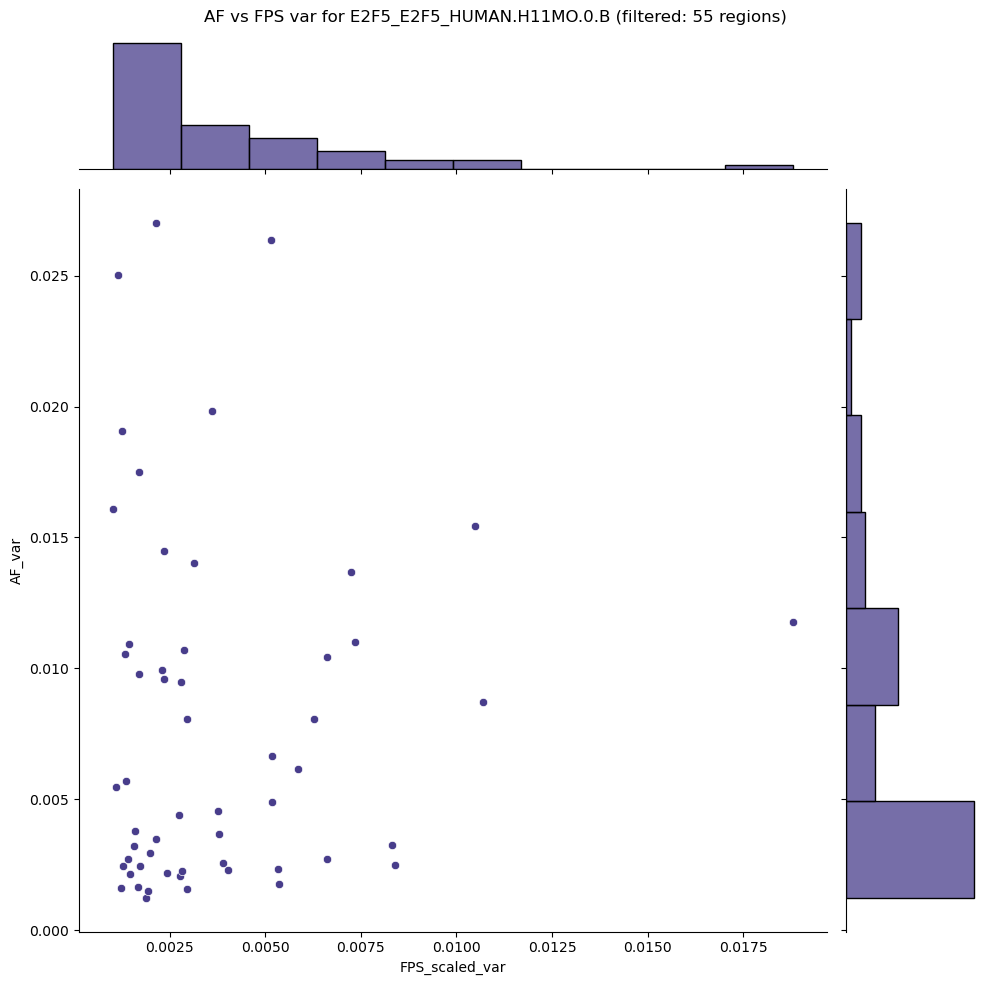

In [25]:
# plot the jointplot
g = sns.jointplot(data=test_df, x="FPS_scaled_var", y="AF_var", height=10, ratio=5, color='darkslateblue' )
g.fig.suptitle(f'AF vs FPS var for {motif_id} (filtered: {len(test_df)} regions)')
plt.tight_layout()
plt.show()

In [26]:
test_df.shape

(55, 2)

### Filtering Variant Sites (FPS)
From here on, it makes sense to filter out variant sites that has `FPS` value `== 0`. This means that the raw FPS values across subtypes are zero, i.e. there is no evidence of footprinting at all at these sites despite a TFBS matching a motif being present (assigned by TOBIAS).

In [27]:
afps_stats_mergesorted

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090,0.000154
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090,0.000154
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090,0.000154
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090,0.000154
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090,0.000154
...,...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.008072
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.008072
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.008072
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.008072


In [28]:
# filter out unique region_id rows that have fps == 0
# group by 'region_id' first 
merged_filt = afps_stats_mergesorted.groupby('region_id').filter(lambda x: x['FPS'].sum() > 0)
merged_filt

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090,0.000154
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090,0.000154
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090,0.000154
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090,0.000154
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090,0.000154
...,...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.008072
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.008072
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.008072
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.008072


In [29]:
# merged_filt[(merged_filt['FPS_cv'].isna() | merged_filt['FPS_qcd'].isna())]

We are not interested in footprints that carry no called variants so we can also filter out all rows with `AF == 0`, as these represent sites that are not variant at all. The only reason they are in the matrix is because during the raw data merging, these sites are retained when there is at least one subtype that has a non-zero AF value at that site, or non-zero FPS values at that site.

However, we would still be interested in sites with AF values not equal zero at least in one of the subtypes, so we do not want to filter out sites that have at least one non-zero AF value.

In [30]:
# filter out unique region_id rows that have AF == 0 in all subtypes (sample_id grouping)
# this has to be per group, so we need to groupby first
merged_filt_nozero = merged_filt.groupby('region_id').filter(lambda x: (x['AF'] != 0).any())
merged_filt_nozero

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090,0.000154
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090,0.000154
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090,0.000154
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090,0.000154
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090,0.000154
...,...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.008072
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.008072
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.008072
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.008072


Now we can select unique `region_id`s that have at least one AF value in the subtype group that is equal to 0 AND the max AF value in the subtype group is more than 0.5. This is because for sites that have a called variant in at least one subtype, we are only interested in them if the called variant has AF of more than 0.5.

We first group the df by the unique values of column `region_id`, then we retain only regions whose max value of column `AF` per unique site is more than 0.5.

In [31]:
# for each unique region_id, find those that has AF == 0 in at least one subtype
# this has to be per group, so we need to groupby first
region_af_zero = merged_filt_nozero.groupby('region_id').filter(lambda x: (x['AF'] == 0).any())
region_af_zero

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
5145,chr1:905473-905483,2GAMBDQ_norm,0.000000,0.14062,0.065892,0.000245,0.000090,0.000154
5146,chr1:905473-905483,98JKPD8_lumA,0.000000,0.10260,0.045183,0.000245,0.000090,0.000154
5147,chr1:905473-905483,ANAB5F7_basal,0.000000,0.12218,0.062660,0.000245,0.000090,0.000154
5148,chr1:905473-905483,PU24GB8_lumB,0.027778,0.12024,0.056307,0.000245,0.000090,0.000154
5149,chr1:905473-905483,S6R691V_her2,0.000000,0.13921,0.069304,0.000245,0.000090,0.000154
...,...,...,...,...,...,...,...,...
10775,chrX:147508113-147508123,2GAMBDQ_norm,0.000000,0.01465,0.006865,0.000012,0.000003,0.000413
10776,chrX:147508113-147508123,98JKPD8_lumA,0.000000,0.00810,0.003567,0.000012,0.000003,0.000413
10777,chrX:147508113-147508123,ANAB5F7_basal,0.045455,0.00633,0.003246,0.000012,0.000003,0.000413
10778,chrX:147508113-147508123,PU24GB8_lumB,0.000000,0.00629,0.002946,0.000012,0.000003,0.000413


In [32]:
# then find the max AF value for each region_id and add to a new column called 'max_AF'
df = region_af_zero.groupby('region_id').agg({'AF': 'max'}).rename(columns={'AF': 'max_AF'}).reset_index()
max_af = df.reindex(index=index_natsorted(df['region_id']))
max_af

,region_id,max_AF
640,chr1:905473-905483,0.027778
526,chr1:1020750-1020760,0.062500
617,chr1:3432506-3432516,0.166667
625,chr1:3948502-3948512,0.181818
629,chr1:5274704-5274714,0.250000
...,...,...
1365,chrX:115338019-115338029,0.029412
1366,chrX:118300271-118300281,0.071429
1367,chrX:119211181-119211191,0.093750
1368,chrX:139342109-139342119,0.066667


In [33]:
# now return a boolean mask for regions that have max_AF <= 0.5
mask = max_af['max_AF'] <= 0.5
# sum here counts the number of True values in the mask
mask.sum()

1379

Now we can filter the merged dataframes such that rows that have `region_id` in the Boolean-masked `max_af` <= 0.5 dataframe will be discarded (so we retain only `region_id` rows that have `max_af` > 0.5).

In [34]:
# this is done by subsetting the long dataframe with an expression that makes use of isin() method on the max_af dataframe masked by the boolean series, and then taking the inverse of the expression using ~
merged_filt_nolowaf = merged_filt_nozero[~(merged_filt_nozero['region_id'].isin(max_af[mask]['region_id']))]

In [35]:
# now filter out the rows with AF == 0 on the merge_filt dataframe
merged_filt_nozeroaf = merged_filt_nozero[~(merged_filt_nozero['region_id'].isin(max_af['region_id']))]
merged_filt_nozeroaf

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
5160,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.019970
5161,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.019970
5162,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.019970
5163,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.019970
5164,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.019970
...,...,...,...,...,...,...,...,...
10780,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.008072
10781,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.008072
10782,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.008072
10783,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.008072


In [36]:
# merged_filt_nozero[merged_filt_nozero['region_id'].isin(max_af['region_id'])]

In [37]:
# save the unique region_id rows where AF == 0 in at least one subtype to file just in case
atleast_one_zero_af = merged_filt_nozero[merged_filt_nozero['region_id'].isin(max_af['region_id'])]

### Filtering Variant Sites (AF)
Now we can calculate the median for AF values to append to the merged, filtered longform dataframe.

In [38]:
# copy the filtered dataframe
mf_df = merged_filt_nozeroaf.copy()
mf_df = mf_df.reset_index(drop=True)
# calculate AF median per region_id
mf_df['AF_median'] = mf_df.groupby('region_id')['AF'].transform('median')
mf_df

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
0,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.019970,0.769231
1,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.019970,0.769231
2,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.019970,0.769231
3,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.019970,0.769231
4,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.019970,0.769231
...,...,...,...,...,...,...,...,...,...
3230,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.008072,0.600000
3231,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.008072,0.600000
3232,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.008072,0.600000
3233,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.008072,0.600000


Let's visualize the AF distribution for each variant site.

In [39]:
dutchfield = ["#e60049", "#0bb4ff", "#87bc45", "#ef9b20", "#b33dc6"]

springpastel = ["#fd7f6f", "#7eb0d5", "#b2e061", "#bd7ebe", "#ffb55a"] 

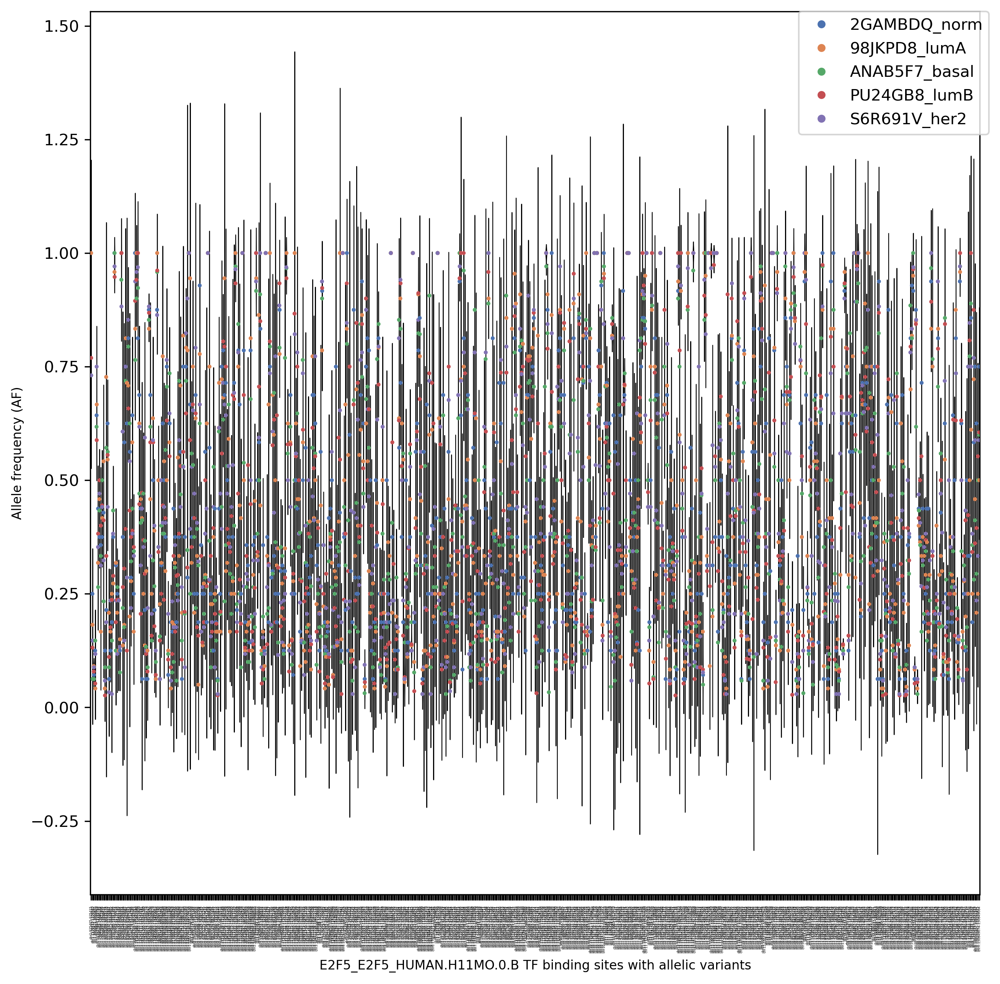

In [40]:
# plot violin plot for AF on the filtered dataframe
plt.figure(figsize=(10, 10), dpi=300)
sns.violinplot(x='region_id', y='AF', data=mf_df, color='lightgray', inner='quartile', linecolor='black', linewidth=0.5)
plt.xticks(rotation=90, fontsize=2)
sns.stripplot(x='region_id', y='AF', data=mf_df, hue='sample_id', size=2.5, jitter=True, palette='deep')


# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants', fontsize=8)
plt.ylabel('Allele frequency (AF)', fontsize=8)
plt.show()

~~Plotting the whole data makes the plot look very busy. We can split the data into 2 groups: 'high AF' and 'low AF'. We will define 'high AF' as `AF_median` > 0.5, and 'low AF' as `AF_median` <= 0.5.~~ 

Let's not just filter by `AF_median`, but instead filter for `region_id` in which none of the AF values are < 0.5.

In [41]:
# to ensure that each unique region_id is retained as a group of subtype rows, we need to filter after grouping per region_id
# high_af = mf_df.groupby('region_id').filter(lambda x: (x['AF_median'] > 0.5).any())
high_af = mf_df.groupby('region_id').filter(lambda x: (x['AF'] > 0.5).all())
high_af

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
0,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.019970,0.769231
1,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.019970,0.769231
2,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.019970,0.769231
3,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.019970,0.769231
4,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.019970,0.769231
...,...,...,...,...,...,...,...,...,...
3200,chrX:34275969-34275979,2GAMBDQ_norm,0.857143,0.02658,0.012455,0.000088,0.000019,0.021762,0.857143
3201,chrX:34275969-34275979,98JKPD8_lumA,0.611111,0.03378,0.014876,0.000088,0.000019,0.021762,0.857143
3202,chrX:34275969-34275979,ANAB5F7_basal,0.888889,0.01175,0.006026,0.000088,0.000019,0.021762,0.857143
3203,chrX:34275969-34275979,PU24GB8_lumB,1.000000,0.02894,0.013552,0.000088,0.000019,0.021762,0.857143


In [42]:
# low_af = mf_df.groupby('region_id').filter(lambda x: (x['AF_median'] <= 0.5).any())
low_af = mf_df.groupby('region_id').filter(lambda x: (x['AF'] <= 0.5).any())
low_af

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
5,chr1:1130413-1130423,2GAMBDQ_norm,0.250000,0.15151,0.070994,0.001668,0.000338,0.004728,0.147059
6,chr1:1130413-1130423,98JKPD8_lumA,0.181818,0.11471,0.050516,0.001668,0.000338,0.004728,0.147059
7,chr1:1130413-1130423,ANAB5F7_basal,0.062500,0.04786,0.024545,0.001668,0.000338,0.004728,0.147059
8,chr1:1130413-1130423,PU24GB8_lumB,0.131579,0.14384,0.067359,0.001668,0.000338,0.004728,0.147059
9,chr1:1130413-1130423,S6R691V_her2,0.147059,0.11338,0.056445,0.001668,0.000338,0.004728,0.147059
...,...,...,...,...,...,...,...,...,...
3230,chrX:150849074-150849084,2GAMBDQ_norm,0.750000,0.20522,0.096162,0.013487,0.002941,0.008072,0.600000
3231,chrX:150849074-150849084,98JKPD8_lumA,0.500000,0.34392,0.151456,0.013487,0.002941,0.008072,0.600000
3232,chrX:150849074-150849084,ANAB5F7_basal,0.600000,0.07363,0.037761,0.013487,0.002941,0.008072,0.600000
3233,chrX:150849074-150849084,PU24GB8_lumB,0.605263,0.24735,0.115831,0.013487,0.002941,0.008072,0.600000


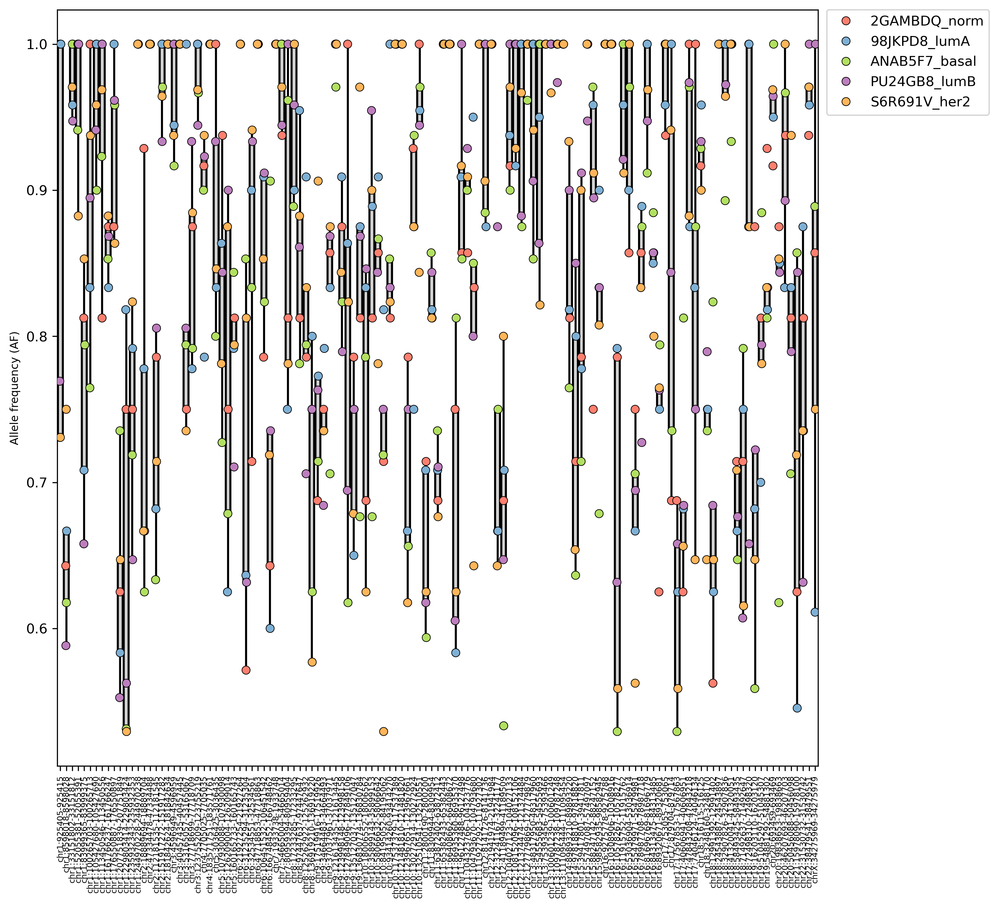

In [85]:
fig_tuple = plt.subplots(figsize=(10, 10), dpi=300, num=1, clear=True)
fig, ax = fig_tuple
# plot violin plot for high AF set
sns.boxplot(x='region_id', y='AF', data=high_af, color='lightgray', linecolor='black', linewidth=1.5, showfliers=False, ax=ax)
plt.xticks(rotation=90, fontsize=6)
sns.stripplot(x='region_id', y='AF', data=high_af, hue='sample_id', size=6, jitter=True, palette=springpastel, linewidth=0.5, edgecolor='black', ax=ax)
# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.225, 1),borderaxespad=0, markerscale=1, fontsize=10)
plt.xlabel('')
plt.ylabel('Allele frequency (AF)', fontsize=8)
plt.show()


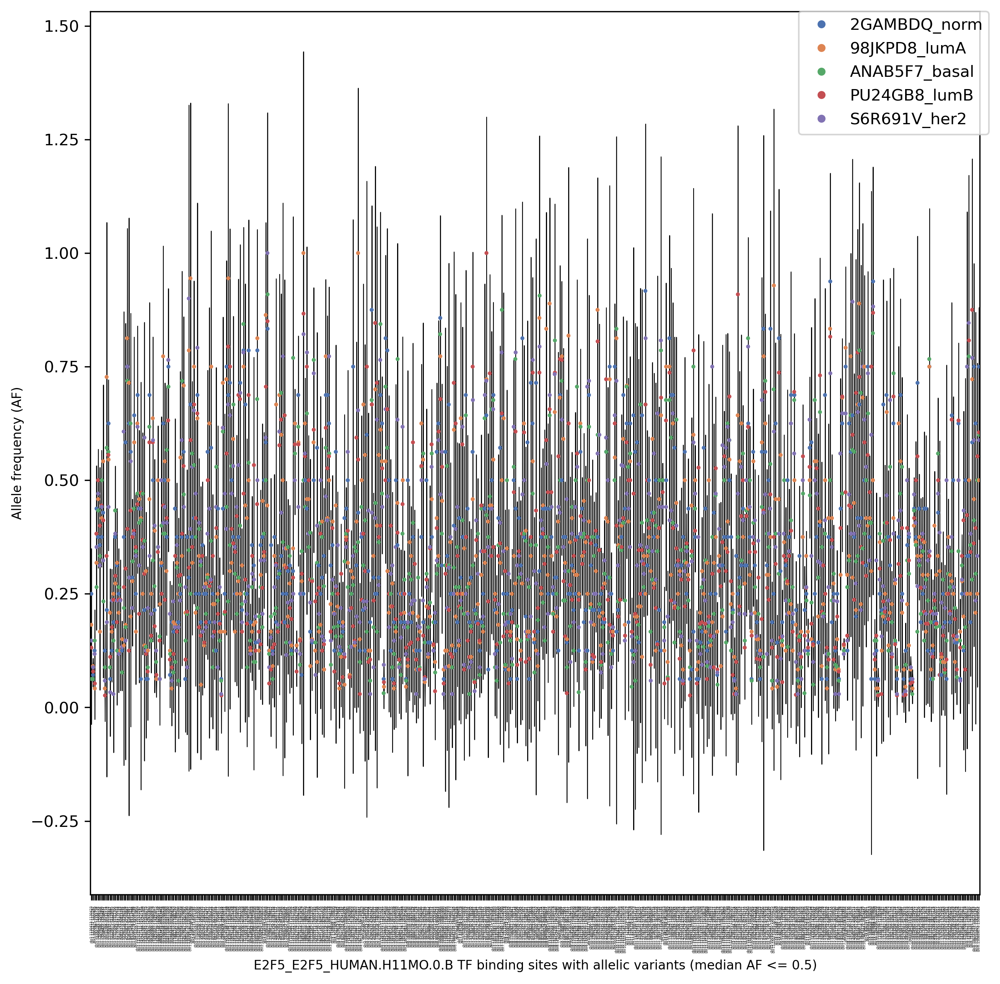

In [44]:
# plot violin plot for low AF set
plt.figure(figsize=(10, 10), dpi=300)
sns.violinplot(x='region_id', y='AF', data=low_af, color='lightgray', inner='quartile', linecolor='black', linewidth=0.5)
plt.xticks(rotation=90, fontsize=2)
sns.stripplot(x='region_id', y='AF', data=low_af, hue='sample_id', size=2.5, jitter=True, palette='deep')


# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF <= 0.5)', fontsize=8)
plt.ylabel('Allele frequency (AF)', fontsize=8)
plt.show()

While we are at it, let's plot the regions where there was at least one subtype with AF value == 0, which is filtered and saved into a file above.

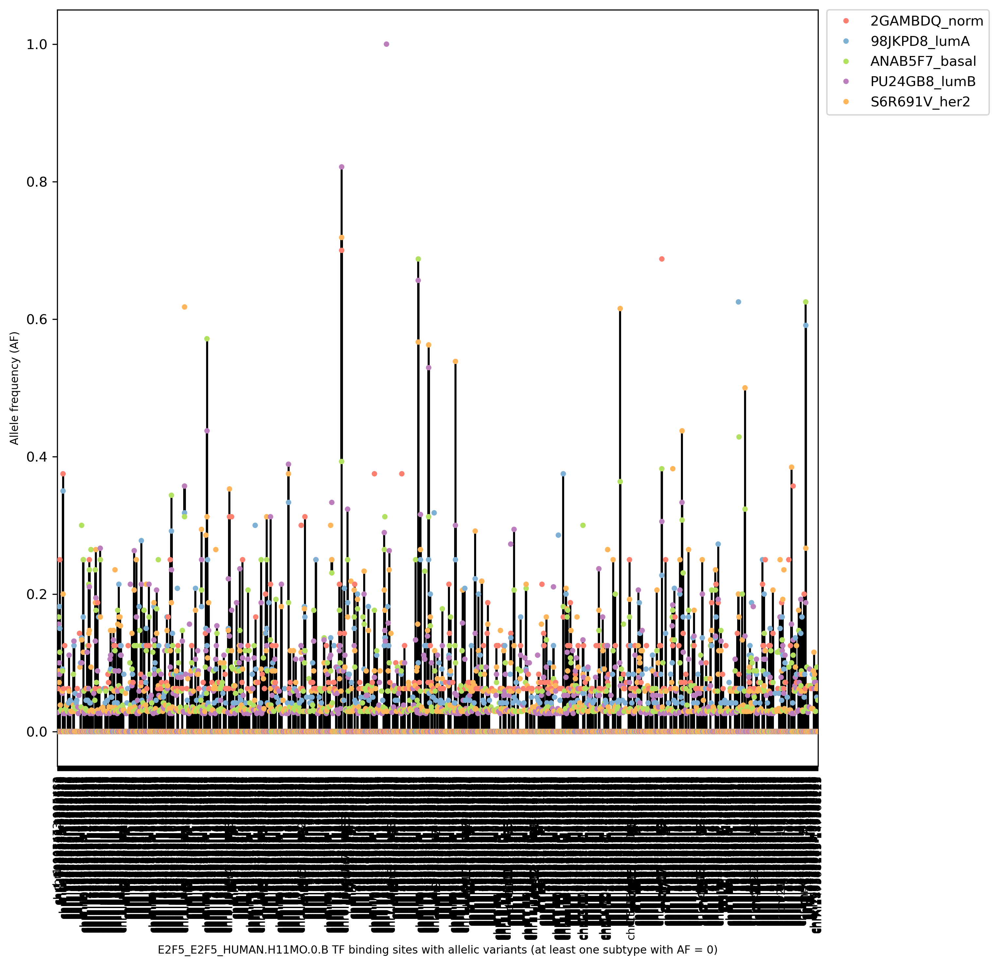

In [45]:
# plot violin plot for sites with at least one subtype with AF == 0
plt.figure(figsize=(10, 10), dpi=300)
sns.boxplot(x='region_id', y='AF', data=atleast_one_zero_af, color='gainsboro', linecolor='black', linewidth=1.5, showfliers=False)
plt.xticks(rotation=90, fontsize=8)
sns.stripplot(x='region_id', y='AF', data=atleast_one_zero_af, hue='sample_id', size=4, jitter=True, palette=springpastel)


# plot legend outside of the plot
plt.legend(bbox_to_anchor=(1.225, 1),borderaxespad=0, markerscale=1, fontsize=10)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (at least one subtype with AF = 0)', fontsize=8)
plt.ylabel('Allele frequency (AF)', fontsize=8)

plt.show()

No clear pattern of enrichment of a specific subtype with high AF compared to the rest can be seen. We can use the subset of these to plot the distribution of the associated FPS values (unscaled). 

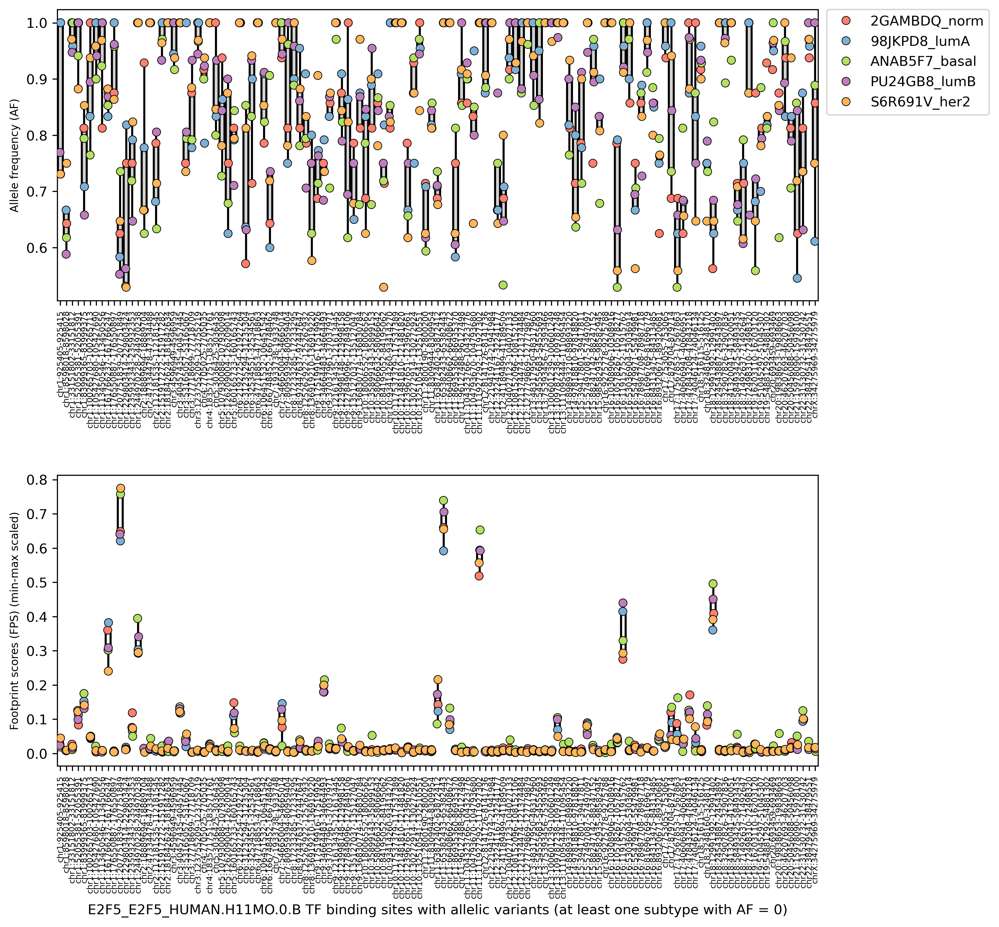

In [91]:

fig, ax = plt.subplots(2, 1, figsize=(10, 10), dpi=300, num=1, clear=True)
# sns.boxplot(x='region_id', y='AF', data=high_af, color='lightgray', linecolor='black', linewidth=1.5, showfliers=False)
# plt.xticks(rotation=90, fontsize=6)
# sns.stripplot(x='region_id', y='AF', data=high_af, hue='sample_id', size=6, jitter=True, palette=springpastel, linewidth=0.5, edgecolor='black')
# # plot legend outside of the plot
# plt.legend(bbox_to_anchor=(1.225, 1),borderaxespad=0, markerscale=1, fontsize=10)
# plt.xlabel('')
# plt.ylabel('Allele frequency (AF)', fontsize=8)

sns.boxplot(x='region_id', y='AF', data=high_af, color='lightgray', linecolor='black', linewidth=1.5, showfliers=False, ax=ax[0])
ax[0].tick_params(axis='x', rotation=90, labelsize=6)
sns.stripplot(x='region_id', y='AF', data=high_af, hue='sample_id', size=6, jitter=True, palette=springpastel, linewidth=0.5, edgecolor='black', ax=ax[0])
# plot legend outside of the plot
ax[0].legend(bbox_to_anchor=(1.225, 1),borderaxespad=0, markerscale=1, fontsize=10)
ax[0].set_xlabel('')
ax[0].set_ylabel('Allele frequency (AF)', fontsize=8)

# then plot the scaled FPS values for these sites
# plt.subplot(2, 1, 2)
# sns.boxplot(x='region_id', y='FPS_scaled', data=high_af, color='white', linecolor='black', linewidth=1.5, showfliers=False)
# plt.xticks(rotation=90, fontsize=6)
# sns.stripplot(x='region_id', y='FPS_scaled', data=high_af, hue='sample_id', size=6, jitter=True, palette=springpastel, legend=False, linewidth=0.5, edgecolor='black')
# plt.xlabel(f'{motif_id} TF binding sites with allelic variants (at least one subtype with AF = 0)', fontsize=10)
# plt.ylabel(f'Footprint scores (FPS) (min-max scaled)', fontsize=8)
# plt.subplots_adjust(hspace=0.6)
# plt.show()

sns.boxplot(x='region_id', y='FPS_scaled', data=high_af, color='white', linecolor='black', linewidth=1.5, showfliers=False, ax=ax[1])
ax[1].tick_params(axis='x', rotation=90, labelsize=6)
sns.stripplot(x='region_id', y='FPS_scaled', data=high_af, hue='sample_id', size=6, jitter=True, palette=springpastel, legend=False, linewidth=0.5, edgecolor='black', ax=ax[1])
ax[1].set_xlabel(f'{motif_id} TF binding sites with allelic variants (at least one subtype with AF = 0)', fontsize=10)
ax[1].set_ylabel(f'Footprint scores (FPS) (min-max scaled)', fontsize=8)

plt.subplots_adjust(hspace=0.6)
plt.show()

Some cancer subtypes appear to not have alternative alleles in certain sites but there is barely any pattern of enrichment in FPS values for any specific subtype.

What is the range of FPS variance in the subset dataframe?

In [47]:
high_af[['FPS_scaled_var', 'AF_var']].describe()

,FPS_scaled_var,AF_var
count,6.350000e+02,635.000000
mean,3.486108e-04,0.005244
std,9.050190e-04,0.005475
min,2.684938e-07,0.000000
25%,4.768179e-06,0.000683
50%,1.861737e-05,0.003836
75%,1.769064e-04,0.007752
max,5.369647e-03,0.022249


Let's now apply thresholding onto the FPS scaled data to denoise the dataset even more. There are two strategies:

1. Thresholding by computing the outlier threshold using the IQR method on `FPS_scaled_var` values.This means we are only keeping regions that show extreme variance in FPS values across subtypes.
2. Thresholding by computing the median of `FPS_scaled` values across subtypes and keeping only regions that have such value above the median at least in one subtype. 

In [48]:
# STRATEGY 1: subset high_af for sites with AF_var > 75th percentile + 1.5 * IQR
iqr = high_af['FPS_scaled_var'].quantile(q=0.75) - high_af['FPS_scaled_var'].quantile(q=0.25)
high_af_fps_outliers = high_af[high_af['FPS_scaled_var'] > high_af['FPS_scaled_var'].quantile(q=0.75) + (1.5 * iqr)]

In [49]:
# before discarding, grab all the regions where AF_var == 0; as we already filter out AF == 0, this would return regions where all subtypes have AF == 1, hence zero variance
# af_var_one = high_af_fps_outliers[high_af_fps_outliers['AF_var'] == 0]
# save to file
# af_var_one.to_csv(f'/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/AF-FPS_regionsorted_full_longtable/{motif_id}_afps_longtable_raw_af_one_across_subtypes.tsv', sep='\t', index=False)

In [50]:
high_af_fps_outliers

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
210,chr1:161766237-161766247,2GAMBDQ_norm,0.875000,0.76865,0.360174,0.022629,0.003065,0.000382,0.868421
211,chr1:161766237-161766247,98JKPD8_lumA,0.833333,0.86762,0.382084,0.022629,0.003065,0.000382,0.868421
212,chr1:161766237-161766247,ANAB5F7_basal,0.852941,0.58857,0.301846,0.022629,0.003065,0.000382,0.868421
213,chr1:161766237-161766247,PU24GB8_lumB,0.868421,0.65888,0.308547,0.022629,0.003065,0.000382,0.868421
214,chr1:161766237-161766247,S6R691V_her2,0.882353,0.48283,0.240372,0.022629,0.003065,0.000382,0.868421
...,...,...,...,...,...,...,...,...,...
3000,chr20:19838653-19838663,2GAMBDQ_norm,0.875000,0.01821,0.008533,0.001915,0.000518,0.011446,0.850000
3001,chr20:19838653-19838663,98JKPD8_lumA,0.850000,0.01684,0.007416,0.001915,0.000518,0.011446,0.850000
3002,chr20:19838653-19838663,ANAB5F7_basal,0.617647,0.11351,0.058213,0.001915,0.000518,0.011446,0.850000
3003,chr20:19838653-19838663,PU24GB8_lumB,0.843750,0.01412,0.006612,0.001915,0.000518,0.011446,0.850000


In [51]:
# and then discard sites if it has AF_var == 0
high_nzaf_outliers = high_af_fps_outliers[high_af_fps_outliers['AF_var'] != 0]
high_nzaf_outliers

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
210,chr1:161766237-161766247,2GAMBDQ_norm,0.875000,0.76865,0.360174,0.022629,0.003065,0.000382,0.868421
211,chr1:161766237-161766247,98JKPD8_lumA,0.833333,0.86762,0.382084,0.022629,0.003065,0.000382,0.868421
212,chr1:161766237-161766247,ANAB5F7_basal,0.852941,0.58857,0.301846,0.022629,0.003065,0.000382,0.868421
213,chr1:161766237-161766247,PU24GB8_lumB,0.868421,0.65888,0.308547,0.022629,0.003065,0.000382,0.868421
214,chr1:161766237-161766247,S6R691V_her2,0.882353,0.48283,0.240372,0.022629,0.003065,0.000382,0.868421
...,...,...,...,...,...,...,...,...,...
3000,chr20:19838653-19838663,2GAMBDQ_norm,0.875000,0.01821,0.008533,0.001915,0.000518,0.011446,0.850000
3001,chr20:19838653-19838663,98JKPD8_lumA,0.850000,0.01684,0.007416,0.001915,0.000518,0.011446,0.850000
3002,chr20:19838653-19838663,ANAB5F7_basal,0.617647,0.11351,0.058213,0.001915,0.000518,0.011446,0.850000
3003,chr20:19838653-19838663,PU24GB8_lumB,0.843750,0.01412,0.006612,0.001915,0.000518,0.011446,0.850000


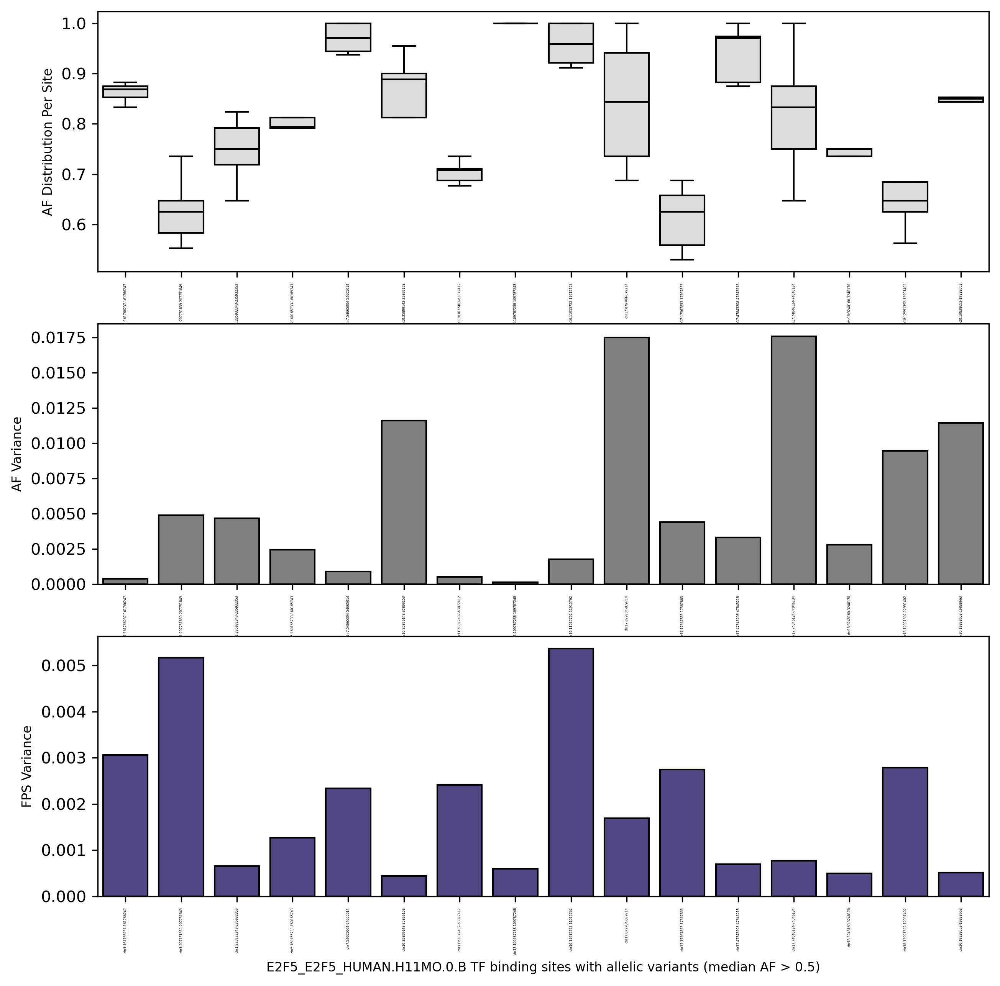

In [52]:
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(3, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outliers, color='gainsboro', linecolor='black', showfliers=False)
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Distribution Per Site', fontsize=8)

plt.subplot(3, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outliers, color='gray', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)

plt.subplot(3, 1, 3)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outliers, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
# plt.yscale('log')
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)

plt.show()

In [53]:
# strategy 2: subset high_af for FPS_scaled > median (of the unsplit dataframe)
# calculate median for the unsplit dataframe
high_af_fps_abovemedian = high_af[high_af['FPS_scaled'] > mf_df['FPS_scaled'].median()]
high_af_fps_abovemedian

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
0,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.019970,0.769231
1,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.019970,0.769231
2,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.019970,0.769231
3,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.019970,0.769231
4,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.019970,0.769231
...,...,...,...,...,...,...,...,...,...
3162,chr22:38479541-38479551,ANAB5F7_basal,0.970588,0.06851,0.035135,0.000287,0.000086,0.000515,0.970588
3164,chr22:38479541-38479551,S6R691V_her2,0.970588,0.03424,0.017046,0.000287,0.000086,0.000515,0.970588
3201,chrX:34275969-34275979,98JKPD8_lumA,0.611111,0.03378,0.014876,0.000088,0.000019,0.021762,0.857143
3203,chrX:34275969-34275979,PU24GB8_lumB,1.000000,0.02894,0.013552,0.000088,0.000019,0.021762,0.857143


In [54]:
high_af_fps_abvmedian_nzaf = high_af_fps_abovemedian[high_af_fps_abovemedian['AF_var'] != 0]
high_af_fps_abvmedian_nzaf

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
0,chr1:925405-925415,2GAMBDQ_norm,1.000000,0.05586,0.026175,0.000659,0.000134,0.019970,0.769231
1,chr1:925405-925415,98JKPD8_lumA,1.000000,0.09540,0.042012,0.000659,0.000134,0.019970,0.769231
2,chr1:925405-925415,ANAB5F7_basal,0.730769,0.03670,0.018821,0.000659,0.000134,0.019970,0.769231
3,chr1:925405-925415,PU24GB8_lumB,0.769231,0.05082,0.023798,0.000659,0.000134,0.019970,0.769231
4,chr1:925405-925415,S6R691V_her2,0.730769,0.09011,0.044860,0.000659,0.000134,0.019970,0.769231
...,...,...,...,...,...,...,...,...,...
3162,chr22:38479541-38479551,ANAB5F7_basal,0.970588,0.06851,0.035135,0.000287,0.000086,0.000515,0.970588
3164,chr22:38479541-38479551,S6R691V_her2,0.970588,0.03424,0.017046,0.000287,0.000086,0.000515,0.970588
3201,chrX:34275969-34275979,98JKPD8_lumA,0.611111,0.03378,0.014876,0.000088,0.000019,0.021762,0.857143
3203,chrX:34275969-34275979,PU24GB8_lumB,1.000000,0.02894,0.013552,0.000088,0.000019,0.021762,0.857143


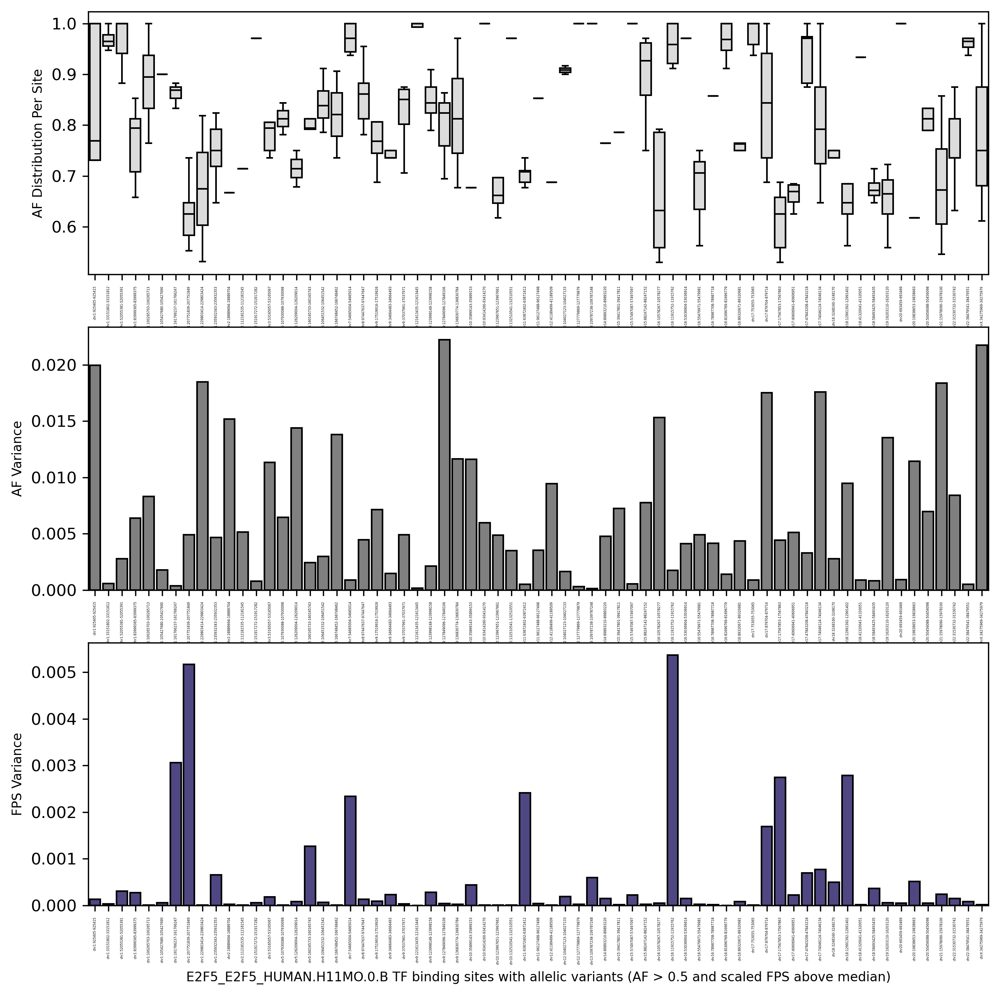

In [55]:
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(3, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_af_fps_abvmedian_nzaf, color='gainsboro', linecolor='black', showfliers=False)
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Distribution Per Site', fontsize=8)

plt.subplot(3, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_af_fps_abvmedian_nzaf, color='gray', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)

plt.subplot(3, 1, 3)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_af_fps_abvmedian_nzaf, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=2)
# plt.yscale('log')
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (AF > 0.5 and scaled FPS above median)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)

plt.show()

In [56]:
high_af_uniq_reg = high_nzaf_outliers[['region_id', 'AF_var', 'FPS_scaled_var']].drop_duplicates()
# sort the region_id in the filtered high_af dataframe based on descending order of AF_var
# afvar_uniqsort = high_af_uniq_reg.sort_values(by='AF_var', ascending=False)
fpsvar_uniqsort = high_af_uniq_reg.sort_values(by='FPS_scaled_var', ascending=False)

In [57]:
# strategy 2
high_af_uniq_reg_strat2 = high_af_fps_abvmedian_nzaf[['region_id', 'AF_var', 'FPS_scaled_var']].drop_duplicates()
# sort the region_id in the filtered high_af dataframe based on descending order of AF_var
# afvar_uniqsort = high_af_uniq_reg.sort_values(by='AF_var', ascending=False)
fpsvar_uniqsort_strat2 = high_af_uniq_reg_strat2.sort_values(by='FPS_scaled_var', ascending=False)

Get the `region_id` ordered list based on AF/FPS variance in descending order.

In [58]:
# extract the region_id from the high_af_fps_var_df_uniqsort dataframe
sorted_region_ids = fpsvar_uniqsort['region_id']

sorted_region_ids_strat2 = fpsvar_uniqsort_strat2['region_id']

In [59]:
# Change 'region_id' to a categorical variable with the categories ordered by 'sorted_region_ids'
df_copy = high_nzaf_outliers.copy()
df_copy['region_id'] = pd.Categorical(high_nzaf_outliers['region_id'], categories=sorted_region_ids, ordered=True)

# Filter the DataFrame
high_nzaf_outlie_filt = df_copy[df_copy['region_id'].isin(sorted_region_ids)]

# Sort the DataFrame by 'region_id'
high_nzaf_outlie_filt = high_nzaf_outlie_filt.sort_values('region_id')
high_nzaf_outlie_filt

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
2495,chr16:11915752-11915762,2GAMBDQ_norm,1.000000,0.58711,0.275108,0.033973,0.005370,0.001758,0.958333
2496,chr16:11915752-11915762,98JKPD8_lumA,0.958333,0.94151,0.414623,0.033973,0.005370,0.001758,0.958333
2497,chr16:11915752-11915762,ANAB5F7_basal,1.000000,0.64275,0.329632,0.033973,0.005370,0.001758,0.958333
2498,chr16:11915752-11915762,PU24GB8_lumB,0.921053,0.93861,0.439541,0.033973,0.005370,0.001758,0.958333
2499,chr16:11915752-11915762,S6R691V_her2,0.911765,0.58832,0.292889,0.033973,0.005370,0.001758,0.958333
...,...,...,...,...,...,...,...,...,...
1758,chr10:35899143-35899153,PU24GB8_lumB,0.954545,0.01006,0.004711,0.001626,0.000437,0.011600,0.888889
1757,chr10:35899143-35899153,ANAB5F7_basal,0.676471,0.10266,0.052649,0.001626,0.000437,0.011600,0.888889
1756,chr10:35899143-35899153,98JKPD8_lumA,0.888889,0.01277,0.005624,0.001626,0.000437,0.011600,0.888889
1755,chr10:35899143-35899153,2GAMBDQ_norm,0.812500,0.02357,0.011044,0.001626,0.000437,0.011600,0.888889


In [60]:
# Change 'region_id' to a categorical variable with the categories ordered by 'sorted_region_ids'
df_copy2 = high_af_fps_abvmedian_nzaf.copy()
df_copy2['region_id'] = pd.Categorical(high_af_fps_abvmedian_nzaf['region_id'], categories=sorted_region_ids_strat2, ordered=True)

# Filter the DataFrame
high_nzaf_outlie_filt_s2 = df_copy2[df_copy2['region_id'].isin(sorted_region_ids_strat2)]

# Sort the DataFrame by 'region_id'
high_nzaf_outlie_filt_s2 = high_nzaf_outlie_filt_s2.sort_values('region_id')
high_nzaf_outlie_filt_s2

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
2496,chr16:11915752-11915762,98JKPD8_lumA,0.958333,0.94151,0.414623,0.033973,0.005370,0.001758,0.958333
2495,chr16:11915752-11915762,2GAMBDQ_norm,1.000000,0.58711,0.275108,0.033973,0.005370,0.001758,0.958333
2497,chr16:11915752-11915762,ANAB5F7_basal,1.000000,0.64275,0.329632,0.033973,0.005370,0.001758,0.958333
2498,chr16:11915752-11915762,PU24GB8_lumB,0.921053,0.93861,0.439541,0.033973,0.005370,0.001758,0.958333
2499,chr16:11915752-11915762,S6R691V_her2,0.911765,0.58832,0.292889,0.033973,0.005370,0.001758,0.958333
...,...,...,...,...,...,...,...,...,...
2555,chr16:81696769-81696779,2GAMBDQ_norm,1.000000,0.03253,0.015243,0.000010,0.000001,0.001402,0.968750
2558,chr16:81696769-81696779,PU24GB8_lumB,0.947368,0.03628,0.016990,0.000010,0.000001,0.001402,0.968750
2559,chr16:81696769-81696779,S6R691V_her2,0.968750,0.03371,0.016782,0.000010,0.000001,0.001402,0.968750
2556,chr16:81696769-81696779,98JKPD8_lumA,1.000000,0.03533,0.015559,0.000010,0.000001,0.001402,0.968750


Next, sort the sample_id values per each unique region_id by a specific order. This order is based on the lexicographic order of the sample_id values in the original matrix.

In [61]:
# get unique sample_id values into a list to define a categorical order
datasets = high_nzaf_outlie_filt['sample_id'].unique().tolist()
datasets = sorted(datasets)

# Create a categorical variable with ordered categories
dataset_copy = high_nzaf_outlie_filt.copy()
dataset_copy['sample_id'] = pd.Categorical(dataset_copy['sample_id'], categories=datasets, ordered=True)

# Sort 'sample_id' within each 'region_id'
high_nzaf_outlie_filtsort = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)

high_nzaf_outlie_filtsort


,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
0,chr16:11915752-11915762,2GAMBDQ_norm,1.000000,0.58711,0.275108,0.033973,0.005370,0.001758,0.958333
1,chr16:11915752-11915762,98JKPD8_lumA,0.958333,0.94151,0.414623,0.033973,0.005370,0.001758,0.958333
2,chr16:11915752-11915762,ANAB5F7_basal,1.000000,0.64275,0.329632,0.033973,0.005370,0.001758,0.958333
3,chr16:11915752-11915762,PU24GB8_lumB,0.921053,0.93861,0.439541,0.033973,0.005370,0.001758,0.958333
4,chr16:11915752-11915762,S6R691V_her2,0.911765,0.58832,0.292889,0.033973,0.005370,0.001758,0.958333
...,...,...,...,...,...,...,...,...,...
75,chr10:35899143-35899153,2GAMBDQ_norm,0.812500,0.02357,0.011044,0.001626,0.000437,0.011600,0.888889
76,chr10:35899143-35899153,98JKPD8_lumA,0.888889,0.01277,0.005624,0.001626,0.000437,0.011600,0.888889
77,chr10:35899143-35899153,ANAB5F7_basal,0.676471,0.10266,0.052649,0.001626,0.000437,0.011600,0.888889
78,chr10:35899143-35899153,PU24GB8_lumB,0.954545,0.01006,0.004711,0.001626,0.000437,0.011600,0.888889


In [62]:
# get unique sample_id values into a list to define a categorical order
datasets_s2 = high_nzaf_outlie_filt_s2['sample_id'].unique().tolist()
datasets_s2 = sorted(datasets_s2)

# Create a categorical variable with ordered categories
dataset_copy_s2 = high_nzaf_outlie_filt_s2.copy()
dataset_copy_s2['sample_id'] = pd.Categorical(dataset_copy_s2['sample_id'], categories=datasets_s2, ordered=True)

# Sort 'sample_id' within each 'region_id'
high_nzaf_outlie_filtsort_s2 = dataset_copy_s2.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)

high_nzaf_outlie_filtsort_s2

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var,AF_median
0,chr16:11915752-11915762,2GAMBDQ_norm,1.000000,0.58711,0.275108,0.033973,0.005370,0.001758,0.958333
1,chr16:11915752-11915762,98JKPD8_lumA,0.958333,0.94151,0.414623,0.033973,0.005370,0.001758,0.958333
2,chr16:11915752-11915762,ANAB5F7_basal,1.000000,0.64275,0.329632,0.033973,0.005370,0.001758,0.958333
3,chr16:11915752-11915762,PU24GB8_lumB,0.921053,0.93861,0.439541,0.033973,0.005370,0.001758,0.958333
4,chr16:11915752-11915762,S6R691V_her2,0.911765,0.58832,0.292889,0.033973,0.005370,0.001758,0.958333
...,...,...,...,...,...,...,...,...,...
226,chr16:81696769-81696779,2GAMBDQ_norm,1.000000,0.03253,0.015243,0.000010,0.000001,0.001402,0.968750
227,chr16:81696769-81696779,98JKPD8_lumA,1.000000,0.03533,0.015559,0.000010,0.000001,0.001402,0.968750
228,chr16:81696769-81696779,ANAB5F7_basal,0.911765,0.02818,0.014452,0.000010,0.000001,0.001402,0.968750
229,chr16:81696769-81696779,PU24GB8_lumB,0.947368,0.03628,0.016990,0.000010,0.000001,0.001402,0.968750


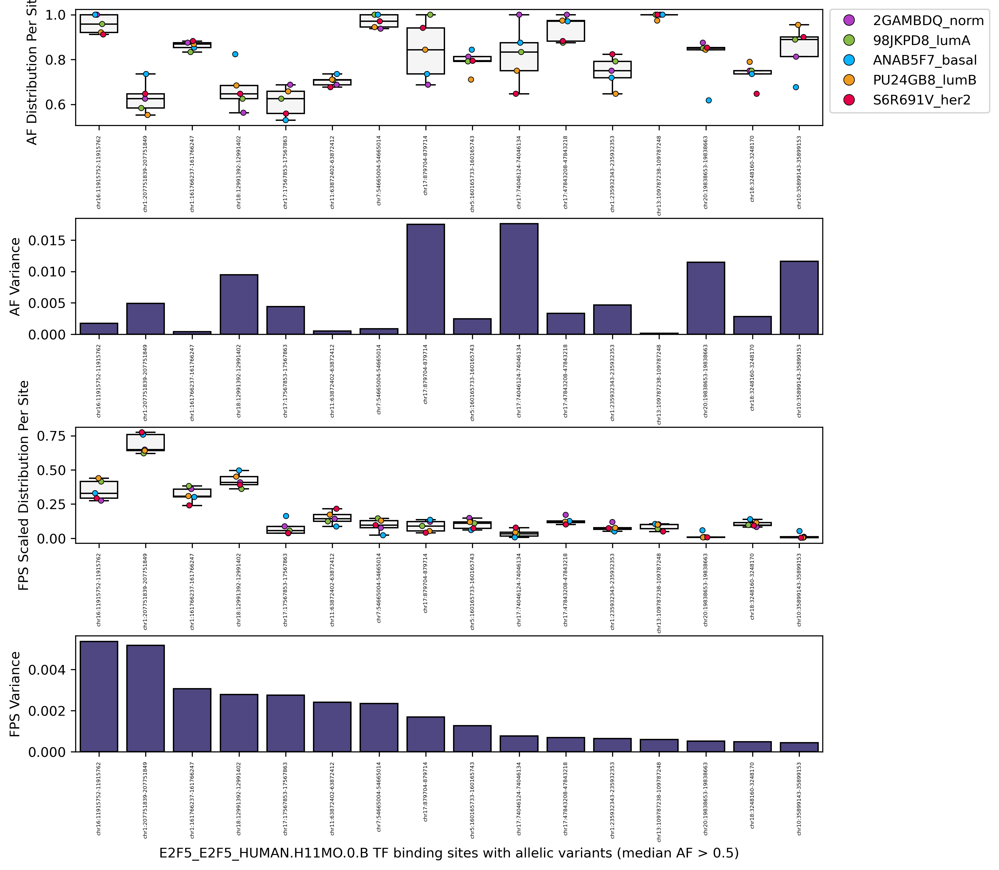

In [63]:
# create color dictionary
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF Distribution Per Site', fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('FPS Scaled Distribution Per Site', fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=10)
plt.ylabel('FPS Variance', fontsize=10)
plt.subplots_adjust(hspace=0.8)
plt.show()

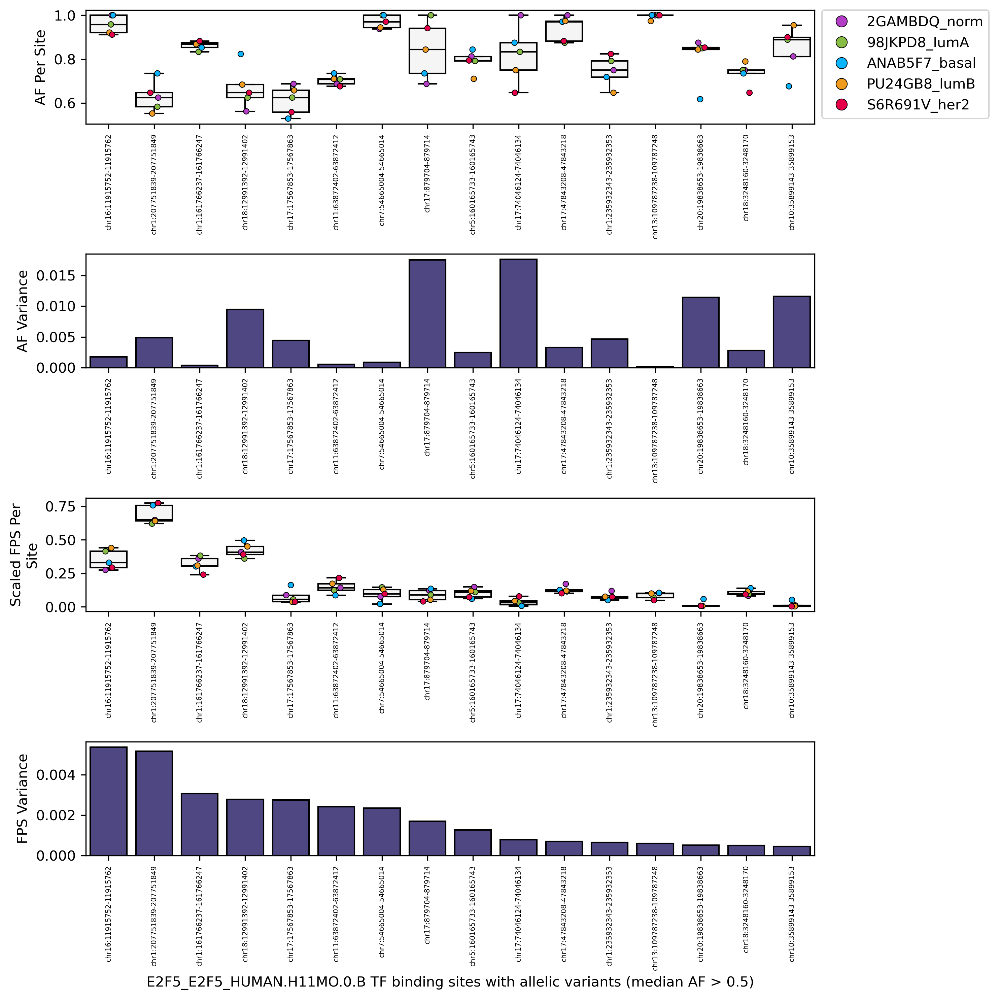

In [97]:
# alternative code
fig, ax = plt.subplots(4, 1, figsize=(10, 10), dpi=300, num=1, clear=True)
import textwrap
# create color dictionary
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False, ax=ax[0])
sns.stripplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black', ax=ax[0])
ax[0].tick_params(axis='x', rotation=90, labelsize=5)
# plot legend outside of the plot
ax[0].legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
ax[0].set_xlabel('')
ylabel = textwrap.fill('AF Per Site', width=15)
ax[0].set_ylabel(ylabel, fontsize=10)

sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black', ax=ax[1])
ax[1].tick_params(axis='x', rotation=90, labelsize=5)
ax[1].set_xlabel('')
ax[1].set_ylabel('AF Variance', fontsize=10)
  

sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False, ax=ax[2])
sns.stripplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black', ax=ax[2])
ax[2].tick_params(axis='x', rotation=90, labelsize=5)
ax[2].set_xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site', width=15)
ax[2].set_ylabel(ylabel, fontsize=10)

sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black', ax=ax[3])
ax[3].tick_params(axis='x', rotation=90, labelsize=5)
ax[3].set_xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=10)
ax[3].set_ylabel('FPS Variance', fontsize=10)
plt.subplots_adjust(hspace=0.8)
plt.tight_layout()
plt.show()

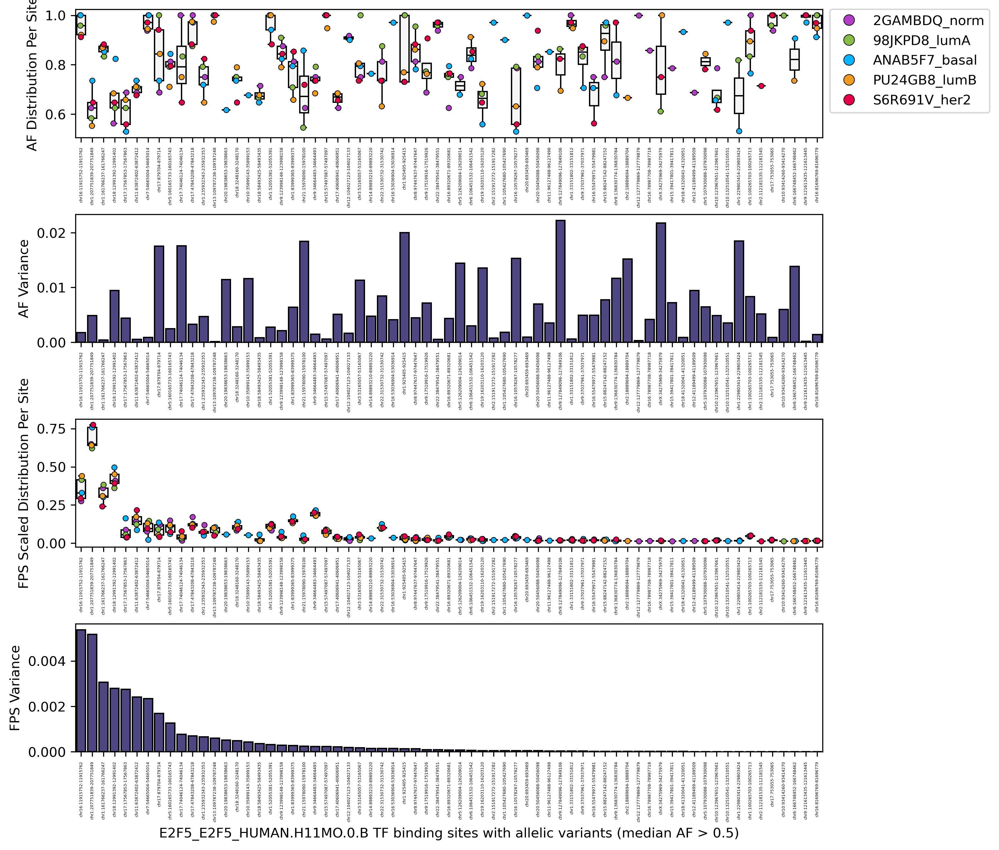

In [64]:
# create color dictionary
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort_s2, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort_s2, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel('')
plt.ylabel('AF Distribution Per Site', fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort_s2, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort_s2, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort_s2, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel('')
plt.ylabel('FPS Scaled Distribution Per Site', fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort_s2, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=3)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=10)
plt.ylabel('FPS Variance', fontsize=10)
plt.subplots_adjust(hspace=0.6)
plt.show()

For FPS distribution there are subtypes that are more represented that others. Let's try to selectively highlight subtypes which are the maxima per site. 

In [65]:
# Find the index of the max FPS_scaled value for each region_id
idx_max = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['FPS_scaled'].idxmax()
idx_min = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['FPS_scaled'].idxmin()
# Select the corresponding rows
max_fps_scaled = high_nzaf_outlie_filtsort.loc[idx_max]
min_fps_scaled = high_nzaf_outlie_filtsort.loc[idx_min]

# do the same for AF
idx_max_af = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['AF'].idxmax()
idx_min_af = high_nzaf_outlie_filtsort.groupby('region_id', observed=True)['AF'].idxmin()
# Select the corresponding rows
max_af_raw = high_nzaf_outlie_filtsort.loc[idx_max_af]
min_af_raw = high_nzaf_outlie_filtsort.loc[idx_min_af]

In [66]:
# Find the index of the max FPS_scaled value for each region_id
idx_max_s2 = high_nzaf_outlie_filtsort_s2.groupby('region_id', observed=True)['FPS_scaled'].idxmax()
idx_min_s2 = high_nzaf_outlie_filtsort_s2.groupby('region_id', observed=True)['FPS_scaled'].idxmin()
# Select the corresponding rows
max_fps_scaled_s2 = high_nzaf_outlie_filtsort_s2.loc[idx_max_s2]
min_fps_scaled_s2 = high_nzaf_outlie_filtsort_s2.loc[idx_min_s2]

# do the same for AF
idx_max_af_s2 = high_nzaf_outlie_filtsort_s2.groupby('region_id', observed=True)['AF'].idxmax()
idx_min_af_s2 = high_nzaf_outlie_filtsort_s2.groupby('region_id', observed=True)['AF'].idxmin()
# Select the corresponding rows
max_af_raw_s2 = high_nzaf_outlie_filtsort_s2.loc[idx_max_af_s2]
min_af_raw_s2 = high_nzaf_outlie_filtsort_s2.loc[idx_min_af_s2]

In [67]:
# create masks for the inverse of max and min values
mask = ~high_nzaf_outlie_filtsort.index.isin(idx_max)
max_fps_scaled_inv = high_nzaf_outlie_filtsort[mask]

mask = ~high_nzaf_outlie_filtsort.index.isin(idx_min)
min_fps_scaled_inv = high_nzaf_outlie_filtsort[mask]

# do the same for AF
mask = ~high_nzaf_outlie_filtsort.index.isin(idx_max_af)
max_af_raw_inv = high_nzaf_outlie_filtsort[mask]

mask = ~high_nzaf_outlie_filtsort.index.isin(idx_min_af)
min_af_raw_inv = high_nzaf_outlie_filtsort[mask]

In [68]:
# create masks for the inverse of max and min values
mask = ~high_nzaf_outlie_filtsort_s2.index.isin(idx_max_s2)
max_fps_scaled_inv_s2 = high_nzaf_outlie_filtsort_s2[mask]

mask = ~high_nzaf_outlie_filtsort_s2.index.isin(idx_min_s2)
min_fps_scaled_inv_s2 = high_nzaf_outlie_filtsort_s2[mask]

# do the same for AF
mask = ~high_nzaf_outlie_filtsort_s2.index.isin(idx_max_af_s2)
max_af_raw_inv_s2 = high_nzaf_outlie_filtsort_s2[mask]

mask = ~high_nzaf_outlie_filtsort_s2.index.isin(idx_min_af_s2)
min_af_raw_inv_s2 = high_nzaf_outlie_filtsort_s2[mask]

In [69]:
# create color dictionary
color_dict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
gray = 'lightgray'
color_gray_dict = {'S6R691V_her2': gray, 'ANAB5F7_basal': gray, '98JKPD8_lumA': gray, 'PU24GB8_lumB': gray, '2GAMBDQ_norm': gray}
# color_dict = {'S6R691V_her2': 'orange', 'ANAB5F7_basal': 'lightseagreen', '98JKPD8_lumA': 'forestgreen', 'PU24GB8_lumB': 'dodgerblue', '2GAMBDQ_norm': 'darkviolet'}
# max_fps_scaled['color'] = max_fps_scaled['sample_id'].map(color_dict)
# min_fps_scaled['color'] = min_fps_scaled['sample_id'].map(color_dict)
# max_af_raw['color'] = max_af_raw['sample_id'].map(color_dict)
# min_af_raw['color'] = min_af_raw['sample_id'].map(color_dict)

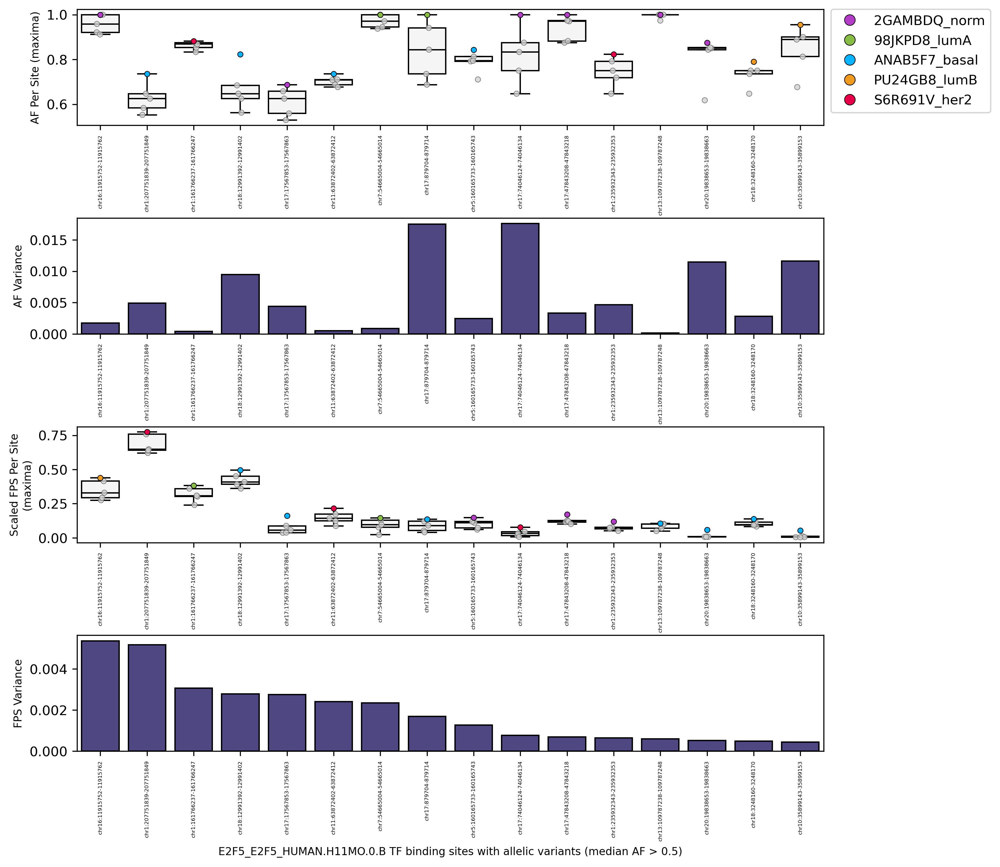

In [70]:
import textwrap
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=max_af_raw_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='AF', data=max_af_raw, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('AF Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)
plt.subplots_adjust(hspace=0.8)

plt.show()

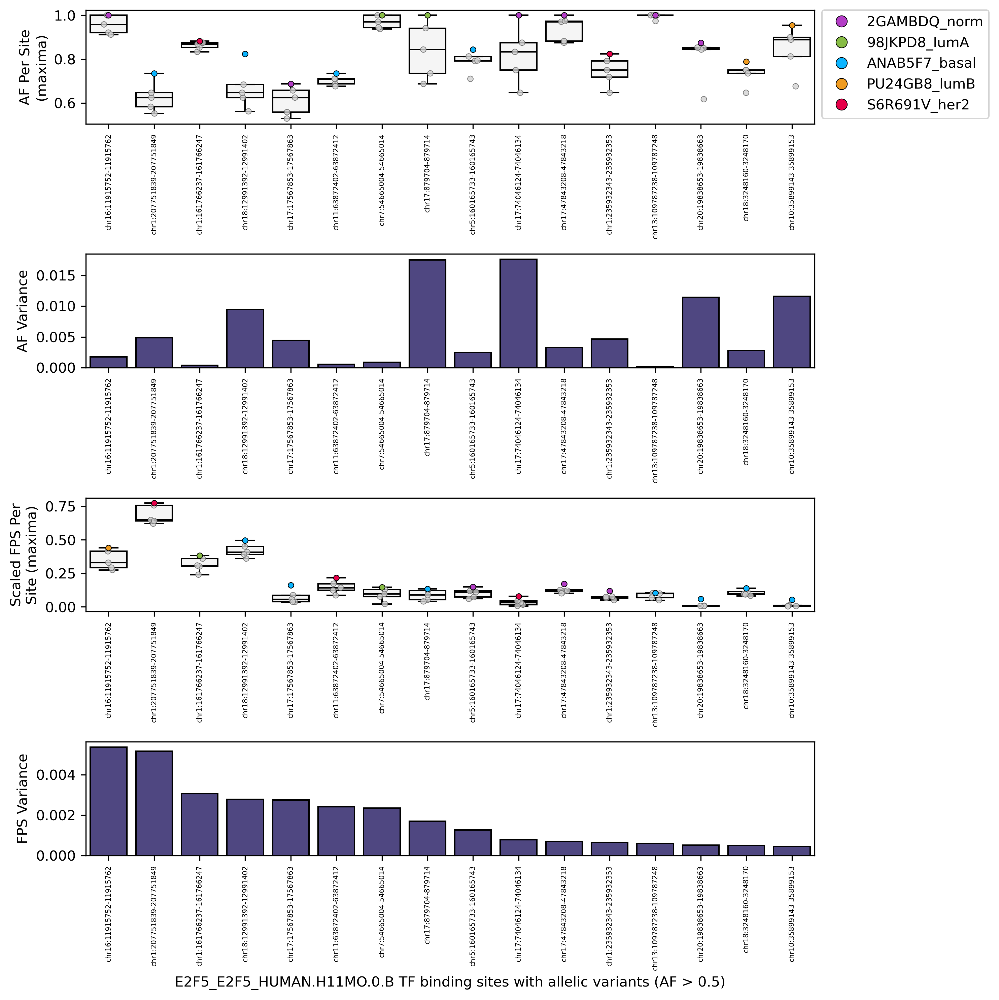

In [98]:
# alternative code
fig, ax = plt.subplots(4, 1, figsize=(10, 10), dpi=300, num=1, clear=True)
import textwrap
# create color dictionary
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False, ax=ax[0])
sns.stripplot(x='region_id', y='AF', data=max_af_raw_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8, ax=ax[0])
sns.stripplot(x='region_id', y='AF', data=max_af_raw, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black', ax=ax[0])
ax[0].tick_params(axis='x', rotation=90, labelsize=5)
# plot legend outside of the plot
ax[0].legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
ax[0].set_xlabel('')
ylabel = textwrap.fill('AF Per Site (maxima)', width=15)
ax[0].set_ylabel(ylabel, fontsize=10)

sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black', ax=ax[1])
ax[1].tick_params(axis='x', rotation=90, labelsize=5)
ax[1].set_xlabel('')
ax[1].set_ylabel('AF Variance', fontsize=10)

sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False, ax=ax[2])
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8, ax=ax[2])
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black', ax=ax[2])
ax[2].tick_params(axis='x', rotation=90, labelsize=5)
ax[2].set_xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (maxima)', width=15)
ax[2].set_ylabel(ylabel, fontsize=10)

sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black', ax=ax[3])
ax[3].tick_params(axis='x', rotation=90, labelsize=5)
ax[3].set_xlabel(f'{motif_id} TF binding sites with allelic variants (AF > 0.5)', fontsize=10)
ax[3].set_ylabel('FPS Variance', fontsize=10)
plt.subplots_adjust(hspace=0.8)
plt.tight_layout()
plt.show()

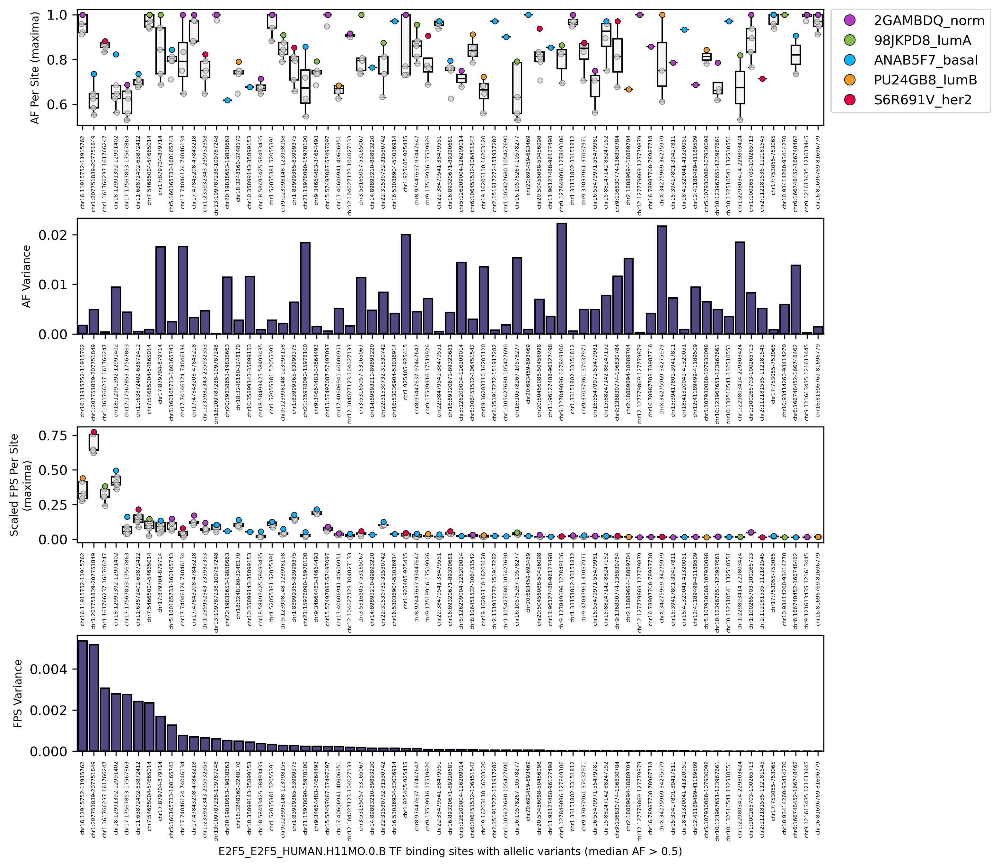

In [71]:
import textwrap
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort_s2, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=max_af_raw_inv_s2, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='AF', data=max_af_raw_s2, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('AF Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort_s2, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort_s2, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled_inv_s2, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled_s2, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort_s2, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)
plt.subplots_adjust(hspace=0.8)

plt.show()

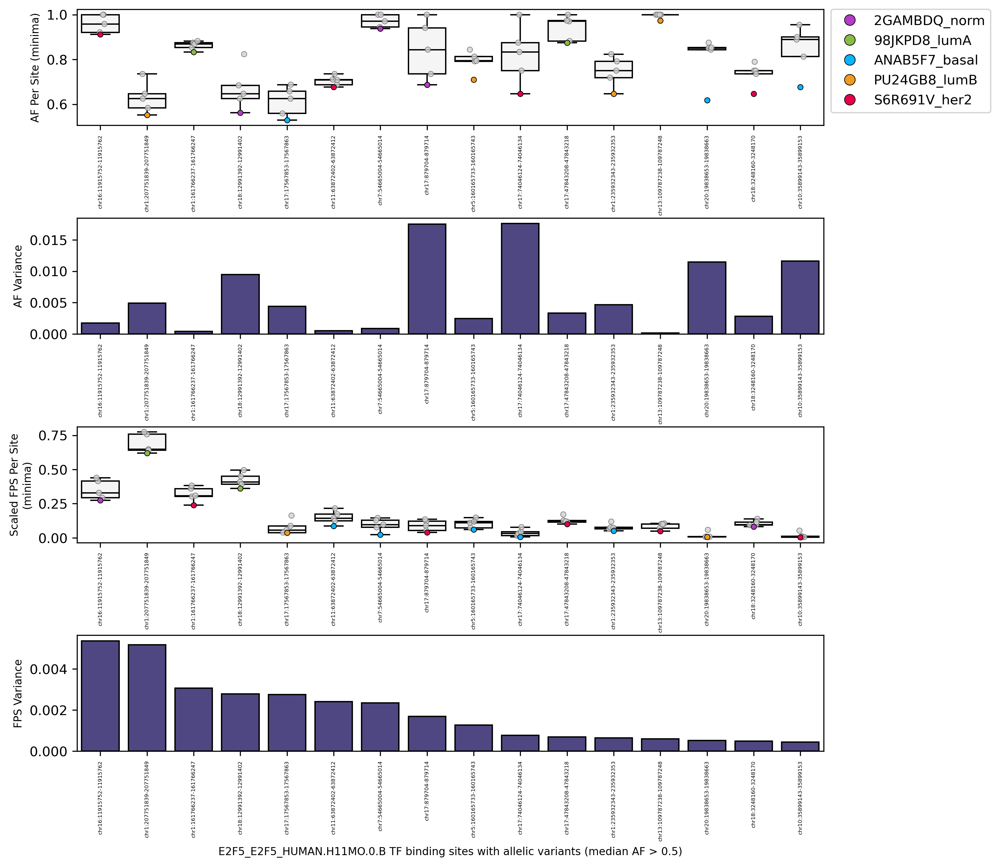

In [72]:
import textwrap
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=min_af_raw_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='AF', data=min_af_raw, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('AF Per Site (minima)', width=20)
plt.ylabel(ylabel, fontsize=8)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=min_fps_scaled_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='FPS_scaled', data=min_fps_scaled, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (minima)', width=20)
plt.ylabel(ylabel, fontsize=8)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)
plt.subplots_adjust(hspace=0.8)

plt.show()

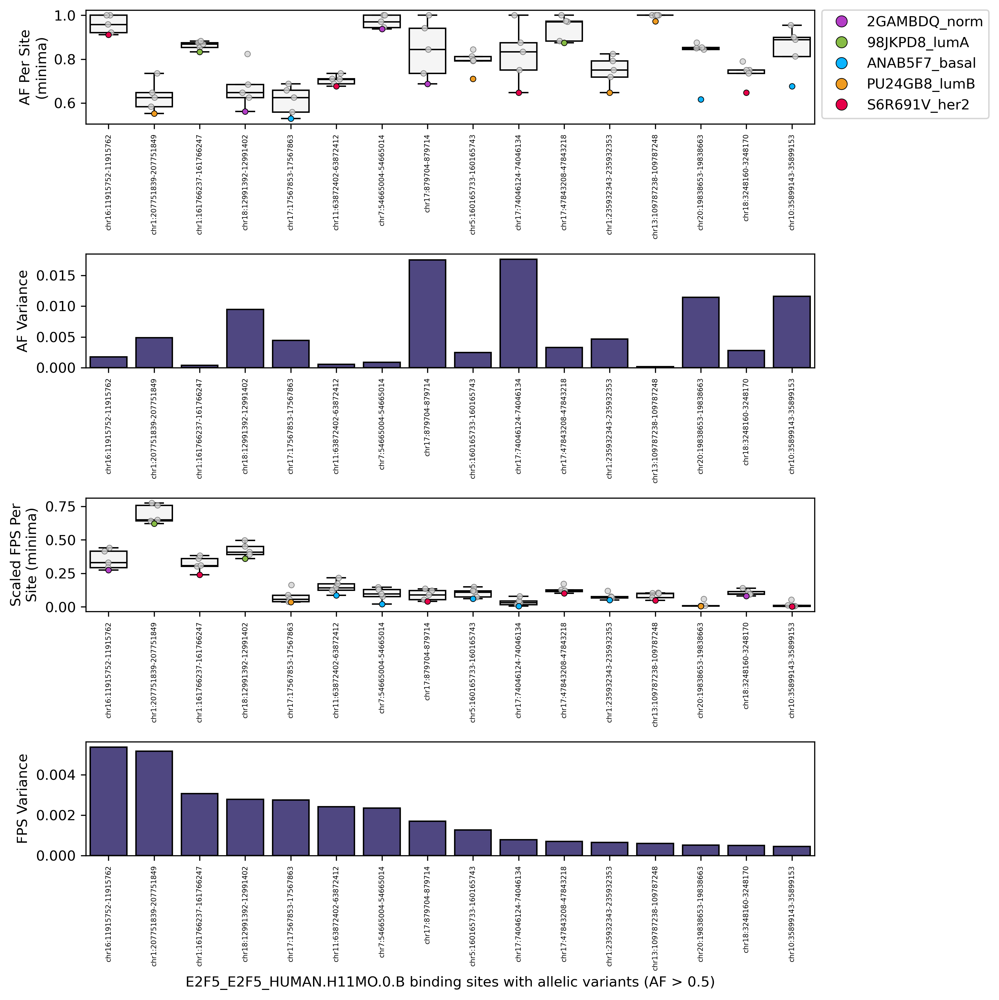

In [100]:
# alternative code
fig, ax = plt.subplots(4, 1, figsize=(10, 10), dpi=300, num=1, clear=True)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False, ax=ax[0])
sns.stripplot(x='region_id', y='AF', data=min_af_raw_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8, ax=ax[0])
sns.stripplot(x='region_id', y='AF', data=min_af_raw, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black', ax=ax[0])
ax[0].tick_params(axis='x', rotation=90, labelsize=5)
# plot legend outside of the plot
ax[0].legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
ax[0].set_xlabel('')
ylabel = textwrap.fill('AF Per Site (minima)', width=15)
ax[0].set_ylabel(ylabel, fontsize=10)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black', ax=ax[1])
ax[1].tick_params(axis='x', rotation=90, labelsize=5)
ax[1].set_xlabel('')
ax[1].set_ylabel('AF Variance', fontsize=10)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_outlie_filtsort, color='whitesmoke', linecolor='black', showfliers=False, ax=ax[2])
sns.stripplot(x='region_id', y='FPS_scaled', data=min_fps_scaled_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8, ax=ax[2])
sns.stripplot(x='region_id', y='FPS_scaled', data=min_fps_scaled, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black', ax=ax[2])
ax[2].tick_params(axis='x', rotation=90, labelsize=5)
ax[2].set_xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (minima)', width=15)
ax[2].set_ylabel(ylabel, fontsize=10)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_outlie_filtsort, color='darkslateblue', edgecolor='black', ax=ax[3])
ax[3].tick_params(axis='x', rotation=90, labelsize=5)
ax[3].set_ylabel('FPS Variance', fontsize=10)
ax[3].set_xlabel(f'{motif_id} binding sites with allelic variants (AF > 0.5)', fontsize=10)
plt.subplots_adjust(hspace=0.8)
plt.tight_layout()
plt.show()

In [73]:
# quantify the number of filtered sites per sample_id
max_af_raw_subset = max_af_raw[['region_id', 'sample_id']]
max_af_raw_df = max_af_raw_subset.groupby('sample_id', observed=False)['region_id'].count().to_frame()

In [74]:
max_af_raw_df

,region_id
sample_id,
2GAMBDQ_norm,6
98JKPD8_lumA,2
ANAB5F7_basal,4
PU24GB8_lumB,2
S6R691V_her2,2


In [75]:
max_fps_scaled_subset = max_fps_scaled[['region_id', 'sample_id']]
max_fps_scaled_df = max_fps_scaled_subset.groupby('sample_id', observed=False)['region_id'].count().to_frame()

In [76]:
max_fps_scaled_df

,region_id
sample_id,
2GAMBDQ_norm,3
98JKPD8_lumA,2
ANAB5F7_basal,7
PU24GB8_lumB,1
S6R691V_her2,3
